| Student Names | Student Number | 
|--------------|----------------| 
| André Filipe Silva          | 20230972 |
| Mariana Cabral         | 20230532 |   
| Sebastião Rosalino     | 20230372 |      
| Sofia Pereira          | 20230568 |     

## Index

1. [Data Exploration](#Data-Exploration)
2. [Data Preprocessing](#Data-Preprocessing)
3. [Genetic Programming](#GP)
4. [Geometric Semantic Genetic Progamming](#GSGP)
5. [Neural Networks](#Neural-Networks)
6. [NEAT](#NEAT)
7. [Evaluation Metrics](#Eval-Metrics)
8. [Best Model Plots](#best-model)

<a id='Data-Exploration'></a>
# 1. Data Exploration

In [1]:
# Import the necessary libraries and configurations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os
import csv
from configparser import ConfigParser
from tempfile import NamedTemporaryFile
import time
import psutil
import threading
import sys
import gc
import itertools

from IPython.display import display, Javascript
from tqdm import tqdm

import sklearn
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from gpolnel.problems.inductive_programming import SML, SMLGS
from gpolnel.utils.ffunctions import Ffunctions
from gpolnel.utils.inductive_programming import function_map
from gpolnel.algorithms.genetic_algorithm import GeneticAlgorithm, GSGP
from gpolnel.operators.initializers import grow, prm_grow, ERC, full, prm_full, rhh
from gpolnel.operators.variators import swap_xo, prm_subtree_mtn, prm_efficient_gs_xo ,prm_efficient_gs_mtn
from gpolnel.operators.selectors import prm_tournament, prm_double_tournament
from sklearn.model_selection import KFold

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import torch.nn.functional as F

from scipy.stats import wilcoxon, friedmanchisquare

import neat
import visualize

In [2]:
start_time = time.time()

In [3]:
# Function to save the notebook
def save_notebook():
    display(Javascript('IPython.notebook.save_checkpoint();'))

# Function to get system memory usage percentage
def system_memory_usage_pct():
    memory = psutil.virtual_memory()
    return memory.percent  # Percentage of total memory usage

# Function to check system memory and act if threshold exceeded
def check_system_memory(percent_threshold, check_interval=1):
    while True:
        mem_usage_pct = system_memory_usage_pct()
        if mem_usage_pct > percent_threshold:
            print(f"System memory threshold exceeded at {mem_usage_pct}%. Saving notebook and stopping execution.")
            save_notebook()
            time.sleep(5)  # Wait a couple of seconds to ensure the notebook is saved
            os._exit(0)
        time.sleep(check_interval)

# Start the memory check in a separate thread
def start_memory_monitor(percent_threshold=90, check_interval=5):
    thread = threading.Thread(target=check_system_memory, args=(percent_threshold, check_interval))
    thread.daemon = True  # Set the thread as a daemon so it will close when the main program exits
    thread.start()
    return thread

# Usage
monitor_thread = start_memory_monitor(98)  # Check if system memory usage exceeds 98% and save and close the notebook if so

In [4]:
# Load the datasets
train = pd.read_csv('datasets/data_project_nel.csv')
y_fat = pd.read_csv('datasets/y_fat.csv')
y_lactose = pd.read_csv('datasets/y_lactose.csv')
y_protein = pd.read_csv('datasets/y_protein.csv')

In [5]:
# Check the first rows of the train dataset
train.head()

,lactation,delivery_age_years,dim,dry_days,forage_kg_day,rumination_min_day,milk_kg_day,milk_kg_min_robot,milkings_day,errors_by_100_milkings,high_cdt_by_100_milkings,watery_by_100_milkings,refusals_by_milking,colostrum_separated_kg
0,7,7.750000,414,56.0,4.310918,434.814010,34.082367,3.695699,2.478261,2.046784,0.0,0.000000,0.077973,0.0
1,8,9.083333,357,78.0,4.167087,589.500000,36.170868,4.024165,2.176471,0.900901,0.0,0.000000,0.014157,0.0
2,6,7.666667,315,69.0,4.903333,542.577778,43.371746,2.715252,2.387302,1.063830,0.0,0.132979,0.045213,12.8
3,7,8.666667,362,69.0,4.294724,628.371901,41.683149,2.733291,2.193370,1.763224,0.0,0.000000,0.061713,16.2
4,5,6.500000,427,58.0,4.798618,479.334112,37.916393,1.888608,3.142857,0.745156,0.0,0.000000,0.444858,20.2


In [6]:
# Check the first rows of the y_fat dataset
y_fat.head()

,fat_percent
0,3.787156
1,3.645519
2,3.458251
3,3.407140
4,4.902554


In [7]:
# Check the first rows of the y_lactose dataset
y_lactose.head()

,lactose_percent
0,4.953503
1,4.983128
2,4.889104
3,4.868969
4,4.845402


In [8]:
# Check the first rows of the y_protein dataset
y_protein.head()

,protein_percent
0,3.511685
1,3.470806
2,3.370124
3,3.221164
4,3.395152


In [9]:
# Check structural information about the train dataset, such as feature names, non-null count and data types
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 324 entries, 0 to 323
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   lactation                 324 non-null    int64  
 1   delivery_age_years        324 non-null    float64
 2   dim                       324 non-null    int64  
 3   dry_days                  177 non-null    float64
 4   forage_kg_day             324 non-null    float64
 5   rumination_min_day        324 non-null    float64
 6   milk_kg_day               324 non-null    float64
 7   milk_kg_min_robot         324 non-null    float64
 8   milkings_day              324 non-null    float64
 9   errors_by_100_milkings    324 non-null    float64
 10  high_cdt_by_100_milkings  324 non-null    float64
 11  watery_by_100_milkings    324 non-null    float64
 12  refusals_by_milking       324 non-null    float64
 13  colostrum_separated_kg    324 non-null    float64
dtypes: float64

In [10]:
# Check the shape of the y_fat dataset
y_fat.shape

(324, 1)

In [11]:
# Confirm that there are no missing values in the fat percentage target
y_fat.isna().sum()

fat_percent    0
dtype: int64

In [12]:
# Check the shape of the y_lactose dataset
y_lactose.shape

(324, 1)

In [13]:
# Confirm that there are no missing values in the lactose percentage target
y_lactose.isna().sum()

lactose_percent    0
dtype: int64

In [14]:
# Check the shape of the y_protein dataset
y_protein.shape

(324, 1)

In [15]:
# Confirm that there are no missing values in the protein percentage target
y_protein.isna().sum()

protein_percent    0
dtype: int64

In [16]:
# Check the missing values per feature in the train dataset
train.isna().sum()

lactation                     0
delivery_age_years            0
dim                           0
dry_days                    147
forage_kg_day                 0
rumination_min_day            0
milk_kg_day                   0
milk_kg_min_robot             0
milkings_day                  0
errors_by_100_milkings        0
high_cdt_by_100_milkings      0
watery_by_100_milkings        0
refusals_by_milking           0
colostrum_separated_kg        0
dtype: int64

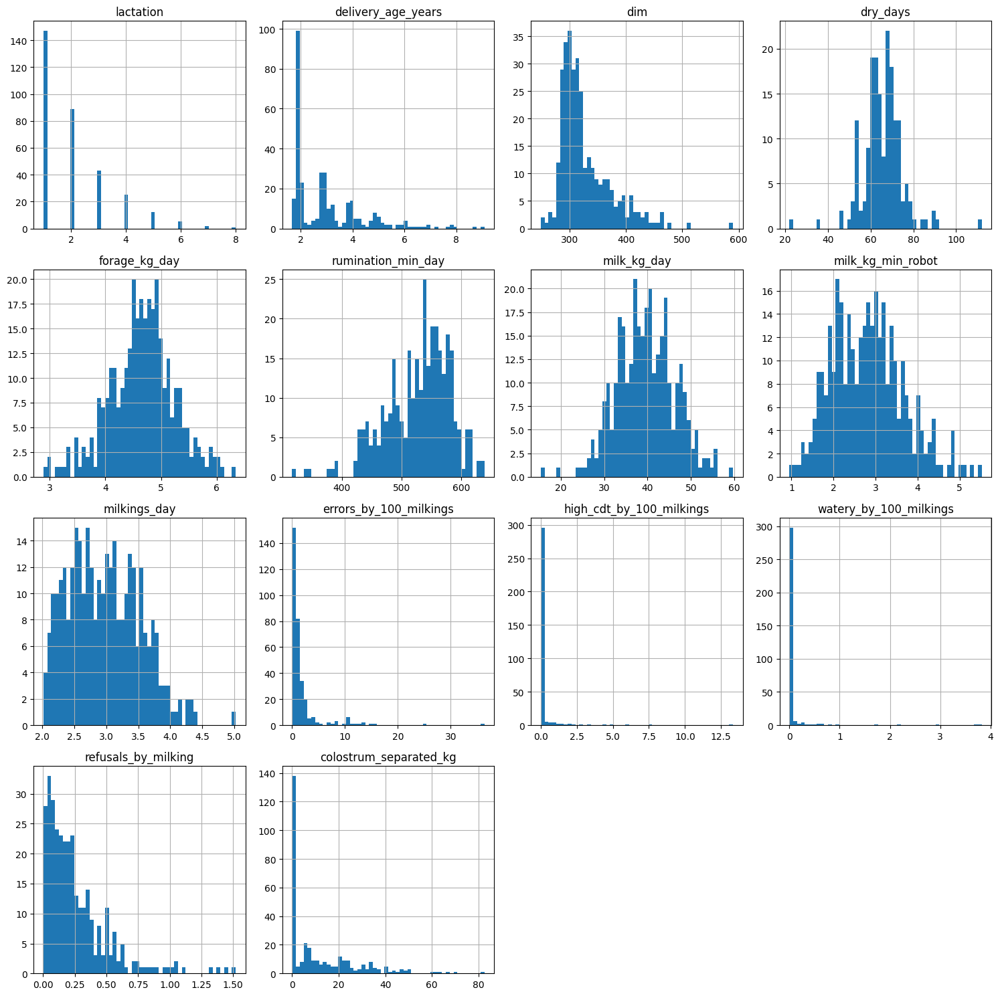

In [17]:
# Check the histograms of the features in the train dataset
train.hist(figsize=(15, 15), bins=50)
plt.grid(False)
plt.tight_layout()
plt.show()

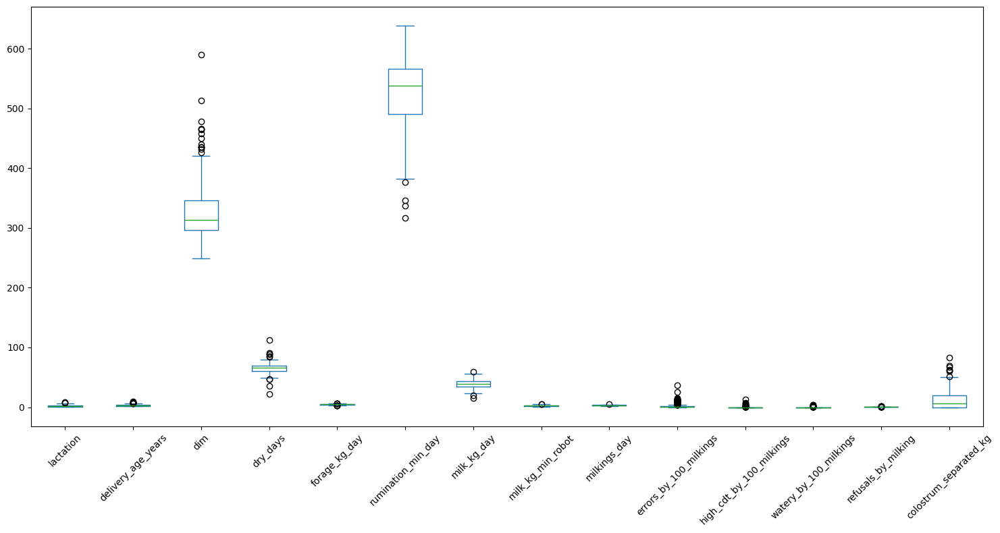

In [18]:
# Check the boxplots of the features in the train dataset, for possible outlier identification
train.plot(kind='box', figsize=(15, 8))
plt.xticks(ticks=range(1, len(train.columns) + 1), labels=train.columns, rotation=45)
plt.tight_layout()
plt.show()

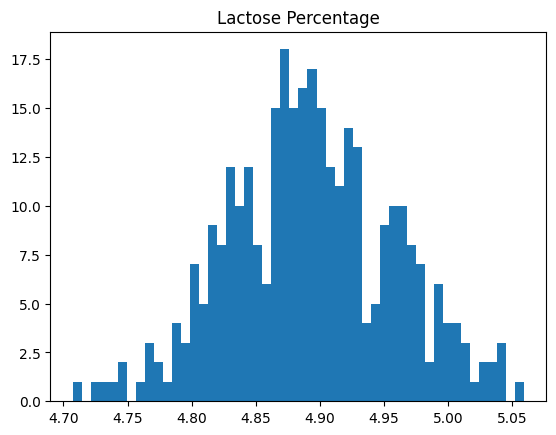

In [19]:
# Check the distribution of the lactose percentage target
plt.hist(y_lactose, bins=50, color='tab:blue')
plt.title('Lactose Percentage')
plt.show()

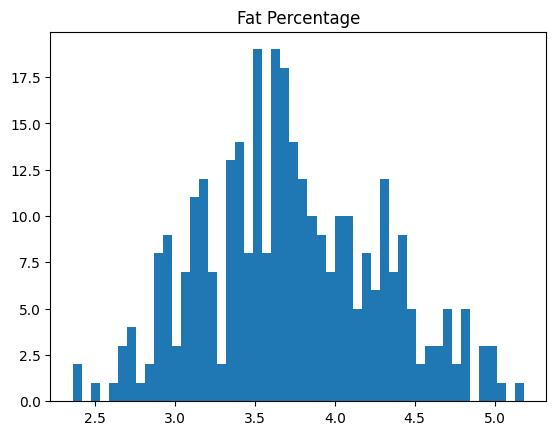

In [20]:
# Check the distribution of the fat percentage target
plt.hist(y_fat, bins=50, color='tab:blue')
plt.title('Fat Percentage')
plt.show()

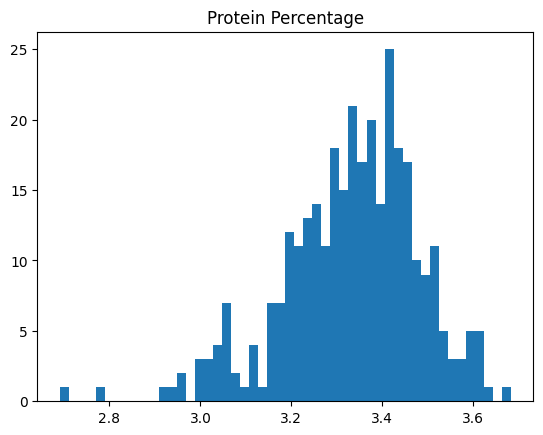

In [21]:
# Check the distribution of the protein percentage target
plt.hist(y_protein, bins=50, color='tab:blue')
plt.title('Protein Percentage')
plt.show()

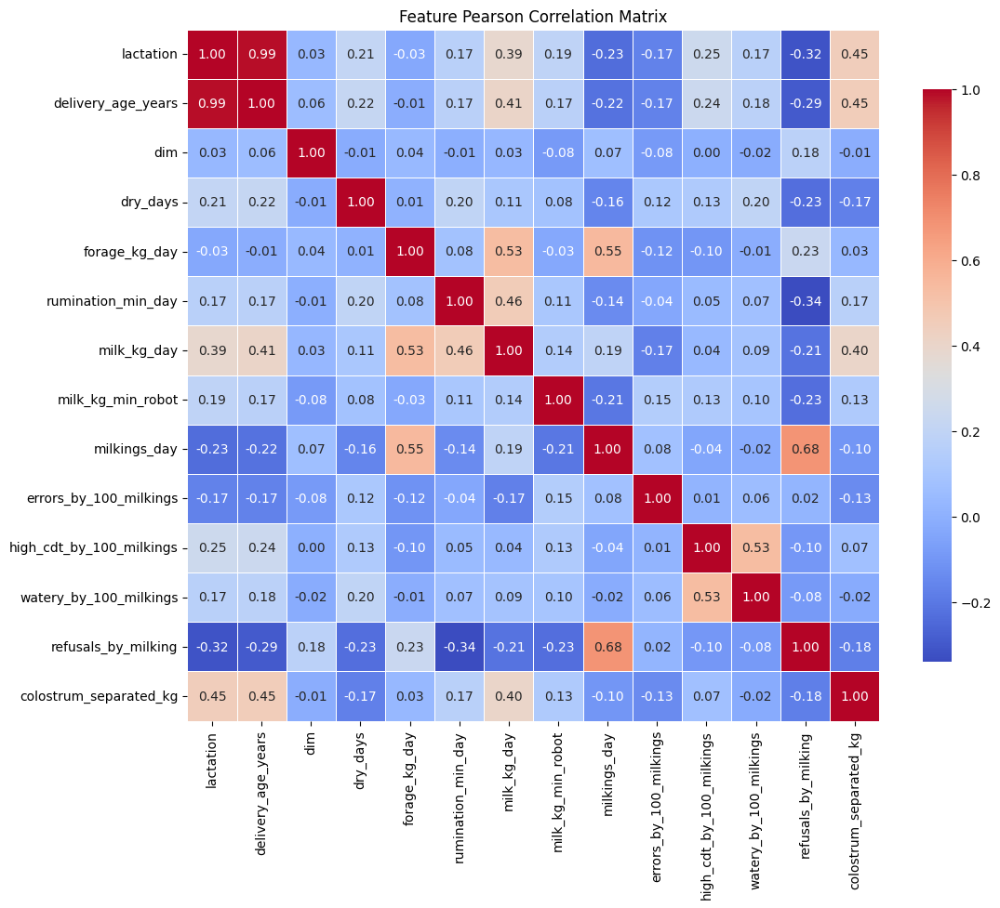

In [22]:
# Calculate the Pearson correlation matrix between features in the train dataset
corr_matrix = train.corr()

plt.figure(figsize=(12, 10))

sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            square=True, linewidths=.5, cbar_kws={"shrink": .8})

plt.title('Feature Pearson Correlation Matrix')
plt.show()

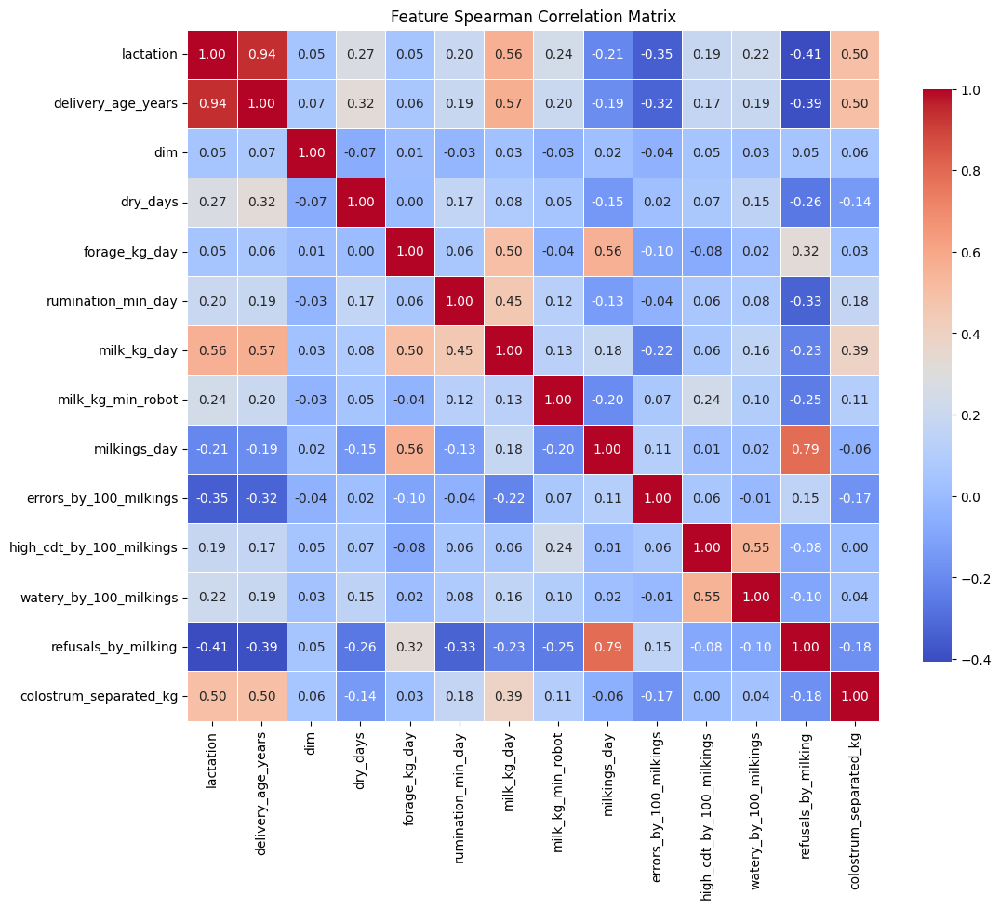

In [23]:
# Calculate the Pearson correlation matrix between features in the train dataset
corr_matrix = train.corr(method='spearman')

plt.figure(figsize=(12, 10))

sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            square=True, linewidths=.5, cbar_kws={"shrink": .8})

plt.title('Feature Spearman Correlation Matrix')
plt.show()

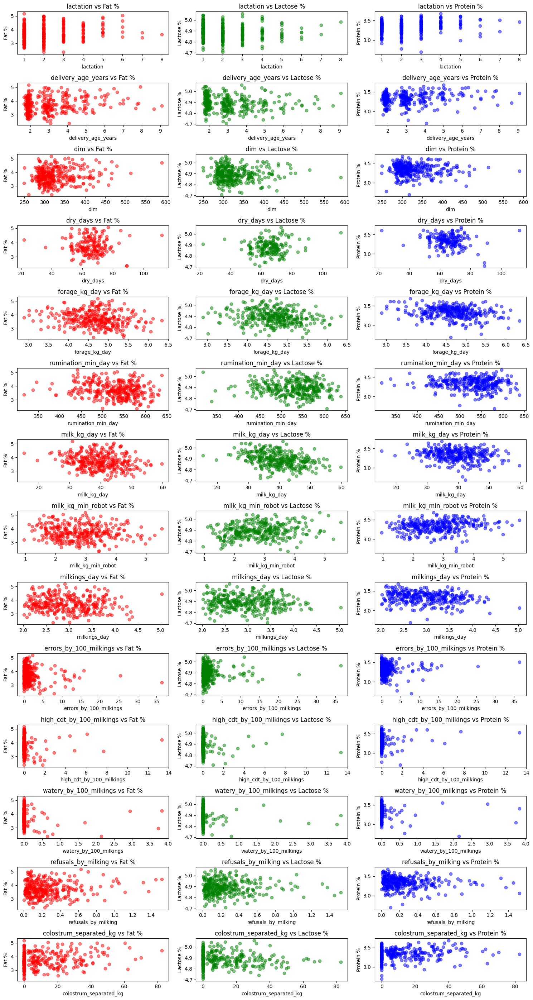

In [24]:
# Number of features
num_features = train.shape[1]
features = train.columns

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=num_features, ncols=3, figsize=(15, 2 * num_features)) 

if num_features == 1:
    axes = axes.reshape(1, -1)

# Loop through each feature and plot against each target
for i, feature in enumerate(features):
    
    # Scatter plot for Fat Percent
    axes[i, 0].scatter(train[feature], y_fat['fat_percent'], color='r', alpha=0.5)
    axes[i, 0].set_title(f'{feature} vs Fat %')
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Fat %')

    # Scatter plot for Lactose Percent
    axes[i, 1].scatter(train[feature], y_lactose['lactose_percent'], color='g', alpha=0.5)
    axes[i, 1].set_title(f'{feature} vs Lactose %')
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel('Lactose %')

    # Scatter plot for Protein Percent
    axes[i, 2].scatter(train[feature], y_protein['protein_percent'], color='b', alpha=0.5)
    axes[i, 2].set_title(f'{feature} vs Protein %')
    axes[i, 2].set_xlabel(feature)
    axes[i, 2].set_ylabel('Protein %')

plt.tight_layout()
plt.show()

<a id='Data-Preprocessing'></a>
# 2. Data Preprocessing

In [25]:
# Dropping the records where "lactation" = 1, so that is possible to use the 'dry_days' feature
train = train[train['lactation'] != 1]

In [26]:
# Matching the existing indexes in the target dataset
y_lactose = y_lactose.loc[train.index]

In [27]:
# Resetting the index in both train and target datasets, dropping the extra created column
train.reset_index(inplace=True, drop=True)
y_lactose.reset_index(inplace=True, drop=True)

In [28]:
# One-hot encoding the 'lactation' feature since it is a categorical feature
train = pd.get_dummies(data=train, columns=['lactation'], dtype=int)

In [29]:
# Check the first 10 rows of the train dataset
train.head(10)

,delivery_age_years,dim,dry_days,forage_kg_day,rumination_min_day,milk_kg_day,milk_kg_min_robot,milkings_day,errors_by_100_milkings,high_cdt_by_100_milkings,watery_by_100_milkings,refusals_by_milking,colostrum_separated_kg,lactation_2,lactation_3,lactation_4,lactation_5,lactation_6,lactation_7,lactation_8
0,7.750000,414,56.0,4.310918,434.814010,34.082367,3.695699,2.478261,2.046784,0.000000,0.000000,0.077973,0.0,0,0,0,0,0,1,0
1,9.083333,357,78.0,4.167087,589.500000,36.170868,4.024165,2.176471,0.900901,0.000000,0.000000,0.014157,0.0,0,0,0,0,0,0,1
2,7.666667,315,69.0,4.903333,542.577778,43.371746,2.715252,2.387302,1.063830,0.000000,0.132979,0.045213,12.8,0,0,0,0,1,0,0
3,8.666667,362,69.0,4.294724,628.371901,41.683149,2.733291,2.193370,1.763224,0.000000,0.000000,0.061713,16.2,0,0,0,0,0,1,0
4,6.500000,427,58.0,4.798618,479.334112,37.916393,1.888608,3.142857,0.745156,0.000000,0.000000,0.444858,20.2,0,0,0,1,0,0,0
5,7.916667,359,77.0,5.092646,534.011111,44.288022,2.239434,2.754875,1.314459,0.000000,0.000000,0.082912,14.4,0,0,0,0,1,0,0
6,6.833333,320,69.0,4.858062,543.697819,45.443438,3.458824,2.443750,1.023018,0.000000,0.000000,0.058824,0.0,0,0,0,1,0,0,0
7,7.833333,336,58.0,4.478661,610.554896,45.106845,3.607234,2.348214,0.760456,0.000000,0.000000,0.083650,29.8,0,0,0,0,1,0,0
8,5.833333,373,71.0,5.324906,434.320856,42.970777,2.418648,3.442359,0.000000,0.000000,0.077882,0.408879,47.0,0,0,1,0,0,0,0
9,7.000000,298,62.0,5.680805,556.604027,47.485570,2.352931,3.718121,0.000000,0.451264,0.000000,0.326715,9.4,0,0,0,1,0,0,0


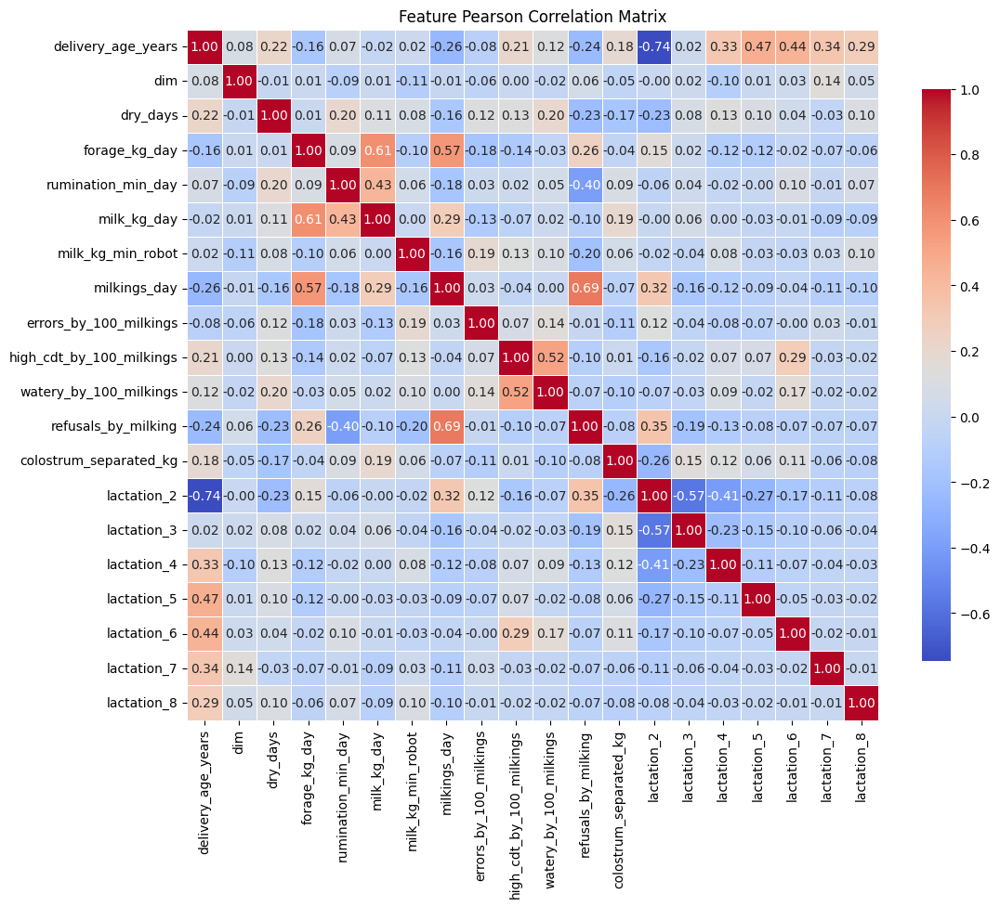

In [30]:
# Calculate the Pearson correlation matrix between features in the train dataset
corr_matrix = train.corr()

plt.figure(figsize=(12, 10))

sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            square=True, linewidths=.5, cbar_kws={"shrink": .8})

plt.title('Feature Pearson Correlation Matrix')
plt.show()

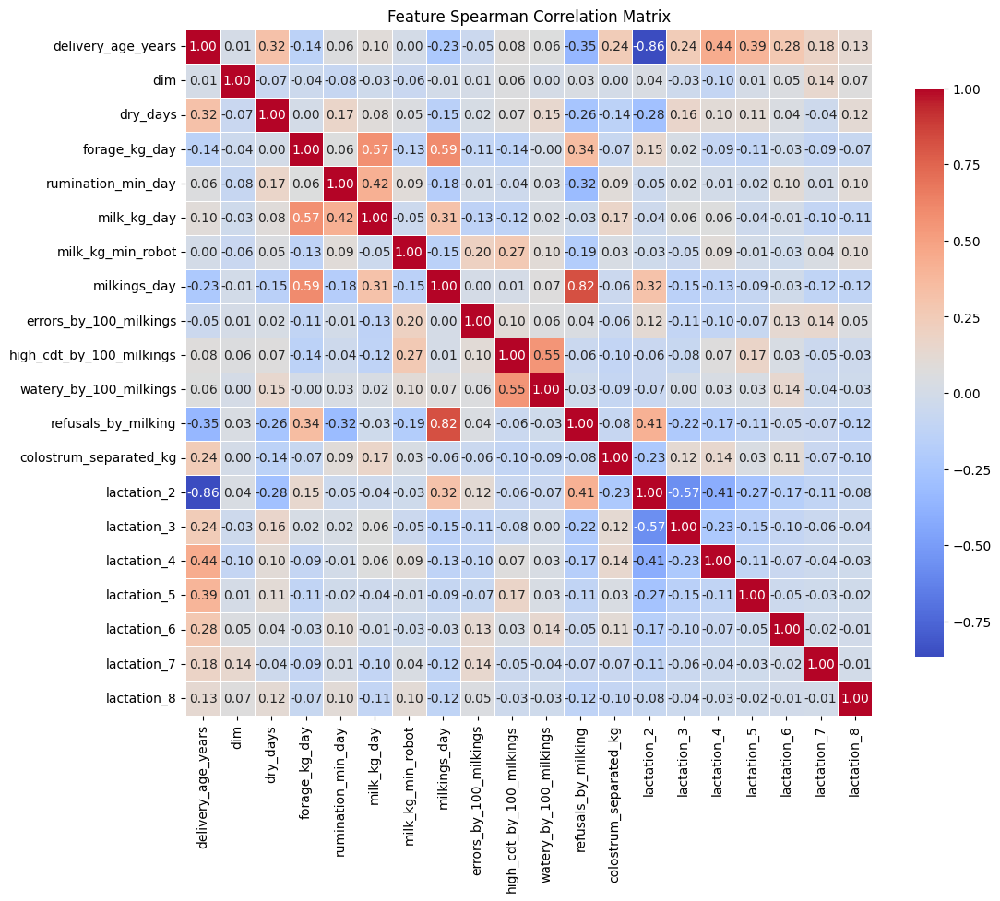

In [31]:
# Calculate the Spearman correlation matrix between features in the train dataset
corr_matrix = train.corr(method='spearman')

plt.figure(figsize=(12, 10))

sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            square=True, linewidths=.5, cbar_kws={"shrink": .8})

plt.title('Feature Spearman Correlation Matrix')
plt.show()

In [32]:
# Dropping the 'dim' feature, since it has insignificant correlations (Pearson and Spearman) with all the other features
train.drop('dim', axis=1, inplace=True)

In [33]:
train.to_csv("train_preprocessed.csv", index = False)

In [34]:
print(f'There are {train.duplicated().sum()} duplicated records.')

There are 0 duplicated records.


<a id='GP'></a>
# 3. Genetic Programming

#### GP with single tournament selection

#### Using max_init_depth = 3:

In [35]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div']]

sspace_sml = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 3,
    'max_depth': 10,
    'n_batches': 1,  # Since we are using the entire dataset in each fold
    'device': 'cpu' 
}

gp_params = {
    'sspace': sspace_sml,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': 'cpu',
    'seed': 42
}


def create_dataloaders(X_train, y_train, X_val, y_val, batch_size, shuffle=True):
    ds_train = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    ds_val = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32))
    dl_train = DataLoader(ds_train, batch_size=batch_size, shuffle=shuffle)
    dl_val = DataLoader(ds_val, batch_size=batch_size, shuffle=shuffle)
    return dl_train, dl_val

def cross_val_genetic_programming(X, y, cv=10, shuffle=True, random_state=42, **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)

        # Ensure batch_size does not exceed the number of samples
        current_batch_size = 141

        dl_train, dl_val = create_dataloaders(X_train, y_train, X_val, y_val, current_batch_size, shuffle)

        # Initialize genetic programming with the current fold's data
        pi_sml = SML(
            sspace=gp_kwargs['sspace'],
            ffunction=Ffunctions('rmse'),
            dl_train=dl_train, dl_test=dl_val,  
            n_jobs=8
        )

        mheuristic = GeneticAlgorithm(
            pi=pi_sml,
            initializer=grow,
            selector=prm_tournament(pressure=gp_kwargs['selection_pressure']),
            crossover=swap_xo,
            mutator=prm_subtree_mtn(initializer=prm_grow(gp_kwargs['sspace'])),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed']
        )

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array(scores)

In [36]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gp_single_tournament_grow_max_init_3 = []

run_1 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state=42
)

# Append the results of the function call to the list
results_gp_single_tournament_grow_max_init_3.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 25
)

# Append the results of the function call to the list
results_gp_single_tournament_grow_max_init_3.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state=63
)

# Append the results of the function call to the list
results_gp_single_tournament_grow_max_init_3.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gp_single_tournament_grow_max_init_3 = list(itertools.chain.from_iterable(results_gp_single_tournament_grow_max_init_3))

print("Cross-validation scores for all runs:", results_gp_single_tournament_grow_max_init_3)
print("Mean cross-validation score for all runs:", np.mean(results_gp_single_tournament_grow_max_init_3))

Cross-validation scores for run 1: [8.4400177e-05 5.8917999e-03 4.0674207e-04 4.0674207e-04 8.4400177e-05
 4.0674207e-04 4.0674207e-04 9.8224944e-03 4.0674207e-04 9.9515915e-04]
Mean cross-validation score: 0.0018911965
Cross-validation scores for run 2: [8.4400177e-05 8.4400177e-05 6.3371658e-04 4.0674207e-04 8.4400177e-05
 3.8828850e-03 6.2036508e-04 6.2036508e-04 8.4400177e-05 6.3371658e-04]
Mean cross-validation score: 0.00071353914
Cross-validation scores for run 3: [9.9515915e-04 8.4400177e-05 8.4400177e-05 1.0375977e-03 2.6464462e-04
 5.1579475e-03 2.6793480e-03 5.9006615e-03 8.4400177e-05 1.2021065e-03]
Mean cross-validation score: 0.0017490666
Cross-validation scores for all runs: [8.440018e-05, 0.0058918, 0.00040674207, 0.00040674207, 8.440018e-05, 0.00040674207, 0.00040674207, 0.009822494, 0.00040674207, 0.0009951591, 8.440018e-05, 8.440018e-05, 0.0006337166, 0.00040674207, 8.440018e-05, 0.003882885, 0.0006203651, 0.0006203651, 8.440018e-05, 0.0006337166, 0.0009951591, 8.440

#### Using max_init_depth = 5:

In [37]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values

sspace_sml = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 5,
    'max_depth': 10,
    'n_batches': 1,  # Since we are using the entire dataset in each fold
    'device': 'cpu'
}

gp_params = {
    'sspace': sspace_sml,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': 'cpu',
    'seed': 42
}

def create_dataloaders(X_train, y_train, X_val, y_val, batch_size, shuffle=True):
    ds_train = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    ds_val = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32))
    dl_train = DataLoader(ds_train, batch_size=batch_size, shuffle=shuffle)
    dl_val = DataLoader(ds_val, batch_size=batch_size, shuffle=shuffle)
    return dl_train, dl_val

def cross_val_genetic_programming(X, y, cv=10, shuffle=True, random_state=42, **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)

        # Ensure batch_size does not exceed the number of samples
        current_batch_size = 141

        dl_train, dl_val = create_dataloaders(X_train, y_train, X_val, y_val, current_batch_size, shuffle)

        # Initialize genetic programming with the current fold's data
        pi_sml = SML(
            sspace=gp_kwargs['sspace'],
            ffunction=Ffunctions('rmse'),
            dl_train=dl_train, dl_test=dl_val,
            n_jobs=8
        )

        mheuristic = GeneticAlgorithm(
            pi=pi_sml,
            initializer=grow,
            selector=prm_tournament(pressure=gp_kwargs['selection_pressure']),
            crossover=swap_xo,
            mutator=prm_subtree_mtn(initializer=prm_grow(gp_kwargs['sspace'])),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],  
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed']
        )

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array(scores)

In [38]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gp_single_tournament_grow_max_init_5 = [] 

run_1 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state=42
)

# Append the results of the function call to the list
results_gp_single_tournament_grow_max_init_5.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state=25
)

# Append the results of the function call to the list
results_gp_single_tournament_grow_max_init_5.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state=63
)

# Append the results of the function call to the list
results_gp_single_tournament_grow_max_init_5.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gp_single_tournament_grow_max_init_5 = list(itertools.chain.from_iterable(results_gp_single_tournament_grow_max_init_5))

print("Cross-validation scores for all runs:", results_gp_single_tournament_grow_max_init_5)
print("Mean cross-validation score for all runs:", np.mean(results_gp_single_tournament_grow_max_init_5))

Cross-validation scores for run 1: [0.00485849 0.08602858 0.00380421 0.00777578 0.00485849 0.00805859
 3.202504   0.01914341 0.00734425 1.562469  ]
Mean cross-validation score: 0.49068445
Cross-validation scores for run 2: [0.01049538 0.00097942 0.01321173 0.00185919 0.01744332 0.00734425
 0.0010376  0.00860317 0.16542989 0.00485849]
Mean cross-validation score: 0.023126243
Cross-validation scores for run 3: [0.00485849 0.00485849 0.00485849 0.00485849 0.00734425 0.00734425
 0.01795318 0.00485849 0.00734425 0.00734425]
Mean cross-validation score: 0.007162263
Cross-validation scores for all runs: [0.004858494, 0.086028576, 0.0038042066, 0.00777578, 0.004858494, 0.008058589, 3.202504, 0.019143414, 0.0073442464, 1.562469, 0.010495383, 0.0009794235, 0.013211727, 0.001859188, 0.017443316, 0.0073442464, 0.0010375977, 0.008603168, 0.16542989, 0.004858494, 0.004858494, 0.004858494, 0.004858494, 0.004858494, 0.0073442464, 0.0073442464, 0.01795318, 0.004858494, 0.0073442464, 0.0073442464]
Mean 

Our **best model** is the first one (**max_init_depth = 3**), so it will be used to test other initializers:

### RHH as initializer:

In [39]:
# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div']]

sspace_sml = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 3,
    'max_depth': 10,
    'n_batches': 1,  # Since we are using the entire dataset in each fold
    'device': 'cpu' 
}

gp_params = {
    'sspace': sspace_sml,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': 'cpu',
    'seed': 42
}

def create_dataloaders(X_train, y_train, X_val, y_val, batch_size, shuffle=True):
    ds_train = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    ds_val = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32))
    dl_train = DataLoader(ds_train, batch_size=batch_size, shuffle=shuffle)
    dl_val = DataLoader(ds_val, batch_size=batch_size, shuffle=shuffle)
    return dl_train, dl_val

def cross_val_genetic_programming(X, y, cv=10, shuffle=True, random_state=42, **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)

        # Ensure batch_size does not exceed the number of samples
        current_batch_size = 141

        dl_train, dl_val = create_dataloaders(X_train, y_train, X_val, y_val, current_batch_size, shuffle)

        # Initialize genetic programming with the current fold's data
        pi_sml = SML(
            sspace=gp_kwargs['sspace'],
            ffunction=Ffunctions('rmse'),
            dl_train=dl_train, dl_test=dl_val,  
            n_jobs=8
        )

        mheuristic = GeneticAlgorithm(
            pi=pi_sml,
            initializer=rhh,
            selector=prm_tournament(pressure=gp_kwargs['selection_pressure']),
            crossover=swap_xo,
            mutator=prm_subtree_mtn(initializer=prm_grow(gp_kwargs['sspace'])),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed']
        )

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array(scores)

In [40]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gp_single_tournament_rhh = []

run_1 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 42
)
results_gp_single_tournament_rhh.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 25
)

results_gp_single_tournament_rhh.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 63
)

results_gp_single_tournament_rhh.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gp_single_tournament_rhh = list(itertools.chain.from_iterable(results_gp_single_tournament_rhh))

print("Cross-validation scores for all runs:", results_gp_single_tournament_rhh)
print("Mean cross-validation score for all runs:", np.mean(results_gp_single_tournament_rhh))

Cross-validation scores for run 1: [0.00734425 0.11675034 0.00485849 0.05249421 0.00485849 0.02351561
 0.00495577 0.00734425 0.01059628 0.00639057]
Mean cross-validation score: 0.023910824
Cross-validation scores for run 2: [0.00734425 0.00485849 0.00485849 0.02169398 0.00485849 0.01868325
 0.01181546 0.06952292 0.00342321 0.00341516]
Mean cross-validation score: 0.015047371
Cross-validation scores for run 3: [0.00197536 0.00485849 0.00485849 0.00734425 0.01728839 0.0179647
 0.01128802 0.01086449 0.00826073 0.00485849]
Mean cross-validation score: 0.00895614
Cross-validation scores for all runs: [0.0073442464, 0.11675034, 0.004858494, 0.052494206, 0.004858494, 0.023515606, 0.004955769, 0.0073442464, 0.010596276, 0.0063905716, 0.0073442464, 0.004858494, 0.004858494, 0.02169398, 0.004858494, 0.018683251, 0.011815458, 0.06952292, 0.003423214, 0.003415161, 0.001975359, 0.004858494, 0.004858494, 0.0073442464, 0.01728839, 0.017964698, 0.011288017, 0.010864487, 0.008260727, 0.004858494]
Mean 

### FULL initialization:

In [41]:
# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div']]

sspace_sml = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 3,
    'max_depth': 10,
    'n_batches': 1,  # Since we are using the entire dataset in each fold
    'device': 'cpu' 
}

gp_params = {
    'sspace': sspace_sml,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': 'cpu',
    'seed': 42
}

def create_dataloaders(X_train, y_train, X_val, y_val, batch_size, shuffle=True):
    ds_train = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    ds_val = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32))
    dl_train = DataLoader(ds_train, batch_size=batch_size, shuffle=shuffle)
    dl_val = DataLoader(ds_val, batch_size=batch_size, shuffle=shuffle)
    return dl_train, dl_val

def cross_val_genetic_programming(X, y, cv=10, shuffle=True, random_state = 42, **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)

        # Ensure batch_size does not exceed the number of samples
        current_batch_size = 141

        dl_train, dl_val = create_dataloaders(X_train, y_train, X_val, y_val, current_batch_size, shuffle)

        # Initialize genetic programming with the current fold's data
        pi_sml = SML(
            sspace=gp_kwargs['sspace'],
            ffunction=Ffunctions('rmse'),
            dl_train=dl_train, dl_test=dl_val,  
            n_jobs=8
        )

        mheuristic = GeneticAlgorithm(
            pi=pi_sml,
            initializer=full,
            selector=prm_tournament(pressure=gp_kwargs['selection_pressure']),
            crossover=swap_xo,
            mutator=prm_subtree_mtn(initializer=prm_grow(gp_kwargs['sspace'])),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed']
        )

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array(scores)


In [42]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gp_single_tournament_full = []

run_1 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 42
)

results_gp_single_tournament_full.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 25
)

results_gp_single_tournament_full.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 63
)

results_gp_single_tournament_full.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gp_single_tournament_full = list(itertools.chain.from_iterable(results_gp_single_tournament_full))

print("Cross-validation scores for all runs:", results_gp_single_tournament_full)
print("Mean cross-validation score for all runs:", np.mean(results_gp_single_tournament_full))

Cross-validation scores for run 1: [0.01359452 0.02842383 0.00012875 0.00782585 0.00485849 0.01136827
 0.00485849 0.00734425 0.00067377 0.01059628]
Mean cross-validation score: 0.008967251
Cross-validation scores for run 2: [0.00485849 0.0019422  0.00485849 0.00485849 0.00485849 0.00039673
 0.00734425 0.00485849 0.10493678 0.0011797 ]
Mean cross-validation score: 0.014009212
Cross-validation scores for run 3: [0.00485849 0.00485849 0.00603999 0.00734425 0.0971899  0.00485849
 0.00782585 0.00485849 0.09224116 0.00485849]
Mean cross-validation score: 0.02349336
Cross-validation scores for all runs: [0.013594525, 0.028423833, 0.00012874603, 0.007825851, 0.004858494, 0.011368275, 0.004858494, 0.0073442464, 0.00067377085, 0.010596276, 0.004858494, 0.0019421994, 0.004858494, 0.004858494, 0.004858494, 0.00039672852, 0.0073442464, 0.004858494, 0.10493678, 0.001179695, 0.004858494, 0.004858494, 0.0060399882, 0.0073442464, 0.0971899, 0.004858494, 0.007825851, 0.004858494, 0.09224116, 0.004858494

**BEST SCORE:** GROW initialization

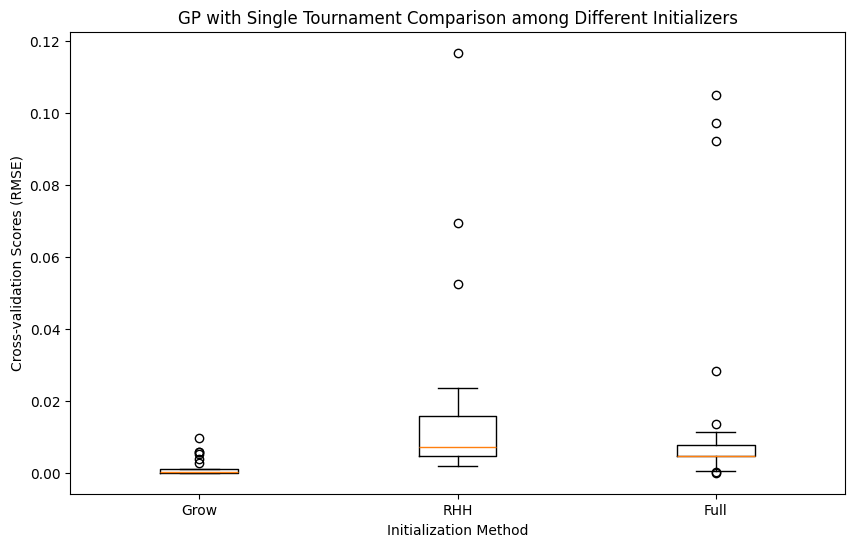

In [43]:
# Combine the scores into a list
data = [results_gp_single_tournament_grow_max_init_3, results_gp_single_tournament_rhh, results_gp_single_tournament_full]

# Labels for each method
labels = ['Grow', 'RHH', 'Full']

# Create the boxplot
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
plt.title('GP with Single Tournament Comparison among Different Initializers')
plt.ylabel('Cross-validation Scores (RMSE)')
plt.xlabel('Initialization Method')
plt.grid(False)
plt.show()

## Double Tournament Selection

> #####  Double Tournament Selection Implementation

This was implemented directly inside gpolnel, in `selectors.py`. The code in the next cell shows our work.

In [44]:
# def prm_double_tournament(pressure, size_criteria=True):
#     """
#     Implements a double tournament selection based on fitness and tree size.

#     Parameters:
#     - pressure: float, the proportion of the population to sample for each tournament.
#     - size_criteria: bool, True if the final selection is based on tree size, False if based on fitness.

#     Returns:
#     - Function that performs the double tournament on a given population.
#     """

#     def double_tournament(pop, min_=True):
#         """
#         Conducts two sequential tournaments to select an individual from the population.

#         Parameters:
#         - pop: Population from which to select individuals.
#         - min_: Boolean, True if minimizing fitness, False if maximizing.

#         Returns:
#         - Index of the winning individual based on the criteria.
#         """

#         def get_size(individual):
#             """
#             Returns the size of the individual.
#             Uses get_size method if available, otherwise uses the length of the representation.
#             """
#             if isinstance(individual, Tree):
#                 return individual.get_size()
#             return len(individual.repr_)

#         def tournament(pop, fitness_min=True):
#             """
#             Conducts a single tournament based on fitness.

#             Parameters:
#             - pop: Population from which to select individuals.
#             - fitness_min: Boolean, True if minimizing fitness, False if maximizing.

#             Returns:
#             - Index of the winner of the tournament.
#             """
#             pool_size = int(len(pop.individuals) * pressure)
#             contestants = random.sample(pop.individuals, pool_size)
#             if fitness_min:
#                 winner = min(contestants, key=lambda ind: ind.fit)
#             else:
#                 winner = max(contestants, key=lambda ind: ind.fit)
#             return pop.individuals.index(winner)

#         # First stage: Perform two independent tournaments based on fitness
#         winner1_idx = tournament(pop, fitness_min=min_)
#         winner2_idx = tournament(pop, fitness_min=min_)

#         # Second stage: Compete based on tree size or fitness
#         winner1 = pop.individuals[winner1_idx]
#         winner2 = pop.individuals[winner2_idx]
        
#         if size_criteria:
#             final_winner = min([winner1, winner2], key=get_size)
#         else:
#             final_winner = min([winner1, winner2], key=lambda ind: ind.fit) if min_ else max([winner1, winner2], key=lambda ind: ind.fit)

#         return pop.individuals.index(final_winner)

#     return double_tournament

#### GP With Double Tournament Selection, Grow Initialization

In [45]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div']]

sspace_sml = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 3,
    'max_depth': 10,
    'n_batches': 1,  # Since we are using the entire dataset in each fold
    'device': 'cpu' 
}

gp_params = {
    'sspace': sspace_sml,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': 'cpu',
    'seed': 42
}

def create_dataloaders(X_train, y_train, X_val, y_val, batch_size, shuffle=True):
    ds_train = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    ds_val = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32))
    dl_train = DataLoader(ds_train, batch_size=batch_size, shuffle=shuffle)
    dl_val = DataLoader(ds_val, batch_size=batch_size, shuffle=shuffle)
    return dl_train, dl_val

def cross_val_genetic_programming(X, y, cv=10, shuffle=True, random_state=42, **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)

        # Ensure batch_size does not exceed the number of samples
        current_batch_size = 141

        dl_train, dl_val = create_dataloaders(X_train, y_train, X_val, y_val, current_batch_size, shuffle)

        # Initialize genetic programming with the current fold's data
        pi_sml = SML(
            sspace=gp_kwargs['sspace'],
            ffunction=Ffunctions('rmse'),
            dl_train=dl_train, dl_test=dl_val,  
            n_jobs=8
        )

        mheuristic = GeneticAlgorithm(
            pi=pi_sml,
            initializer=grow,
            selector=prm_double_tournament(pressure=gp_kwargs['selection_pressure']),
            crossover=swap_xo,
            mutator=prm_subtree_mtn(initializer=prm_grow(gp_kwargs['sspace'])),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed']
        )

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array(scores)

In [46]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gp_double_tournament_grow = []

run_1 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 42
)

results_gp_double_tournament_grow.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score for run 1:", np.mean(run_1))

del run_1 
gc.collect()

run_2 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 25
)

results_gp_double_tournament_grow.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score for run 2:", np.mean(run_2))

del run_2 
gc.collect()

run_3 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 63
)

results_gp_double_tournament_grow.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score for run 3:", np.mean(run_3))

del run_3
gc.collect()

results_gp_double_tournament_grow = list(itertools.chain.from_iterable(results_gp_double_tournament_grow))

print("Cross-validation scores for all runs:", results_gp_double_tournament_grow)
print("Mean cross-validation score for all runs:", np.mean(results_gp_double_tournament_grow))

Cross-validation scores for run 1: [0.08439542 0.09939098 0.08439542 0.08465728 0.08666936 0.09999358
 0.08439542 0.08666936 0.08439542 0.08598571]
Mean cross-validation score for run 1: 0.088094786
Cross-validation scores for run 2: [0.00754274 0.08939503 0.08465727 0.08666936 0.08666936 0.08439542
 0.08603345 0.09939098 0.00119114 0.08666936]
Mean cross-validation score for run 2: 0.071261406
Cross-validation scores for run 3: [0.0842396  0.11873426 2.5946794  0.08543248 0.08439542 0.09939098
 0.08603345 0.08598571 0.08598571 0.08791834]
Mean cross-validation score for run 3: 0.34127954
Cross-validation scores for all runs: [0.084395416, 0.09939098, 0.084395416, 0.08465728, 0.086669356, 0.09999358, 0.084395416, 0.086669356, 0.084395416, 0.085985705, 0.0075427354, 0.08939503, 0.084657274, 0.086669356, 0.086669356, 0.084395416, 0.08603345, 0.09939098, 0.0011911392, 0.086669356, 0.0842396, 0.118734255, 2.5946794, 0.085432485, 0.084395416, 0.09939098, 0.08603345, 0.085985705, 0.085985705

#### GP With Double Tournament Selection, RHH Initialization

In [47]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div']]

sspace_sml = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 3,
    'max_depth': 10,
    'n_batches': 1,  # Since we are using the entire dataset in each fold
    'device': 'cpu' 
}

gp_params = {
    'sspace': sspace_sml,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': 'cpu',
    'seed': 42
}

def create_dataloaders(X_train, y_train, X_val, y_val, batch_size, shuffle=True):
    ds_train = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    ds_val = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32))
    dl_train = DataLoader(ds_train, batch_size=batch_size, shuffle=shuffle)
    dl_val = DataLoader(ds_val, batch_size=batch_size, shuffle=shuffle)
    return dl_train, dl_val

def cross_val_genetic_programming(X, y, cv=10, shuffle=True, random_state=42, **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)

        # Ensure batch_size does not exceed the number of samples
        current_batch_size = 141

        dl_train, dl_val = create_dataloaders(X_train, y_train, X_val, y_val, current_batch_size, shuffle)

        # Initialize genetic programming with the current fold's data
        pi_sml = SML(
            sspace=gp_kwargs['sspace'],
            ffunction=Ffunctions('rmse'),
            dl_train=dl_train, dl_test=dl_val,  
            n_jobs=8
        )

        mheuristic = GeneticAlgorithm(
            pi=pi_sml,
            initializer=rhh,
            selector=prm_double_tournament(pressure=gp_kwargs['selection_pressure'], size_criteria = True),
            crossover=swap_xo,
            mutator=prm_subtree_mtn(initializer=prm_grow(gp_kwargs['sspace'])),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed']
        )

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array(scores)

In [48]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gp_double_tournament_rhh = []

run_1 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 42
)

results_gp_double_tournament_rhh.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score for run 1:", np.mean(run_1))

del run_1 
gc.collect()

run_2 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 25
)

results_gp_double_tournament_rhh.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score for run 2:", np.mean(run_2))

del run_2 
gc.collect()

run_3 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 63
)

results_gp_double_tournament_rhh.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score for run 3:", np.mean(run_3))

del run_3
gc.collect()

results_gp_double_tournament_rhh = list(itertools.chain.from_iterable(results_gp_double_tournament_rhh))

print("Cross-validation scores for all runs:", results_gp_double_tournament_rhh)
print("Mean cross-validation score for all runs:", np.mean(results_gp_double_tournament_rhh))

Cross-validation scores for run 1: [1.2567044e-02 6.5040588e-04 4.5637719e-02 1.4680892e-01 2.7202606e-02
 4.8584938e-03 8.8167191e-04 2.5796835e+00 4.8584938e-03 4.5338325e-02]
Mean cross-validation score for run 1: 0.28684872
Cross-validation scores for run 2: [0.6274741  0.0147213  0.00782585 0.00734425 0.00734425 0.07196867
 0.00734425 0.05123913 0.00253534 0.01687193]
Mean cross-validation score for run 2: 0.081466906
Cross-validation scores for run 3: [1.1633019e-02 4.8584938e-03 1.1075974e-01 7.3442464e-03 2.5796835e+00
 6.1388329e-02 2.5024414e-03 6.1464310e-04 5.3168651e-02 7.8258514e-03]
Mean cross-validation score for run 3: 0.28397787
Cross-validation scores for all runs: [0.012567044, 0.0006504059, 0.04563772, 0.14680892, 0.027202606, 0.004858494, 0.0008816719, 2.5796835, 0.004858494, 0.045338325, 0.6274741, 0.014721299, 0.007825851, 0.0073442464, 0.0073442464, 0.071968675, 0.0073442464, 0.051239125, 0.002535343, 0.01687193, 0.011633019, 0.004858494, 0.11075974, 0.00734424

#### GP With Double Tournament Selection, Full Initialization

In [49]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div']]

sspace_sml = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 3,
    'max_depth': 10,
    'n_batches': 1,  # Since we are using the entire dataset in each fold
    'device': 'cpu' 
}

gp_params = {
    'sspace': sspace_sml,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': 'cpu',
    'seed': 42
}

def create_dataloaders(X_train, y_train, X_val, y_val, batch_size, shuffle=True):
    ds_train = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    ds_val = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32))
    dl_train = DataLoader(ds_train, batch_size=batch_size, shuffle=shuffle)
    dl_val = DataLoader(ds_val, batch_size=batch_size, shuffle=shuffle)
    return dl_train, dl_val

def cross_val_genetic_programming(X, y, cv=10, shuffle=True, random_state=42, **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)

        # Ensure batch_size does not exceed the number of samples
        current_batch_size = 141

        dl_train, dl_val = create_dataloaders(X_train, y_train, X_val, y_val, current_batch_size, shuffle)

        # Initialize genetic programming with the current fold's data
        pi_sml = SML(
            sspace=gp_kwargs['sspace'],
            ffunction=Ffunctions('rmse'),
            dl_train=dl_train, dl_test=dl_val,  
            n_jobs=8
        )

        mheuristic = GeneticAlgorithm(
            pi=pi_sml,
            initializer=full,
            selector=prm_double_tournament(pressure=gp_kwargs['selection_pressure'], size_criteria = True),
            crossover=swap_xo,
            mutator=prm_subtree_mtn(initializer=prm_grow(gp_kwargs['sspace'])),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed']
        )

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array(scores)

In [50]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gp_double_tournament_full = []

run_1 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 42
)

results_gp_double_tournament_full.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score for run 1:", np.mean(run_1))

del run_1 
gc.collect()

run_2 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 25
)

results_gp_double_tournament_full.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score for run 2:", np.mean(run_2))

del run_2 
gc.collect()

run_3 = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state = 63
)

results_gp_double_tournament_full.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score for run 3:", np.mean(run_3))

del run_3
gc.collect()

results_gp_double_tournament_full = list(itertools.chain.from_iterable(results_gp_double_tournament_full))

print("Cross-validation scores for all runs:", results_gp_double_tournament_full)
print("Mean cross-validation score for all runs:", np.mean(results_gp_double_tournament_full))

Cross-validation scores for run 1: [0.00485849 0.00485849 0.00485849 0.00782585 0.00485849 0.02232545
 0.00826073 0.00968185 0.00485849 0.02472592]
Mean cross-validation score for run 1: 0.009711226
Cross-validation scores for run 2: [0.00485849 0.00119591 0.05611753 0.00485849 0.00485849 0.00485849
 0.14548908 0.01015257 0.4640285  0.22870684]
Mean cross-validation score for run 2: 0.09251244
Cross-validation scores for run 3: [0.00485849 0.00485849 0.00435829 0.00734425 0.00478125 0.00485849
 0.00485849 0.00485849 0.00734425 0.00485849]
Mean cross-validation score for run 3: 0.0052978992
Cross-validation scores for all runs: [0.004858494, 0.004858494, 0.004858494, 0.007825851, 0.004858494, 0.022325449, 0.008260727, 0.009681854, 0.004858494, 0.024725916, 0.004858494, 0.0011959076, 0.056117535, 0.004858494, 0.004858494, 0.004858494, 0.14548908, 0.010152566, 0.4640285, 0.22870684, 0.004858494, 0.004858494, 0.0043582916, 0.0073442464, 0.004781246, 0.004858494, 0.004858494, 0.004858494, 0

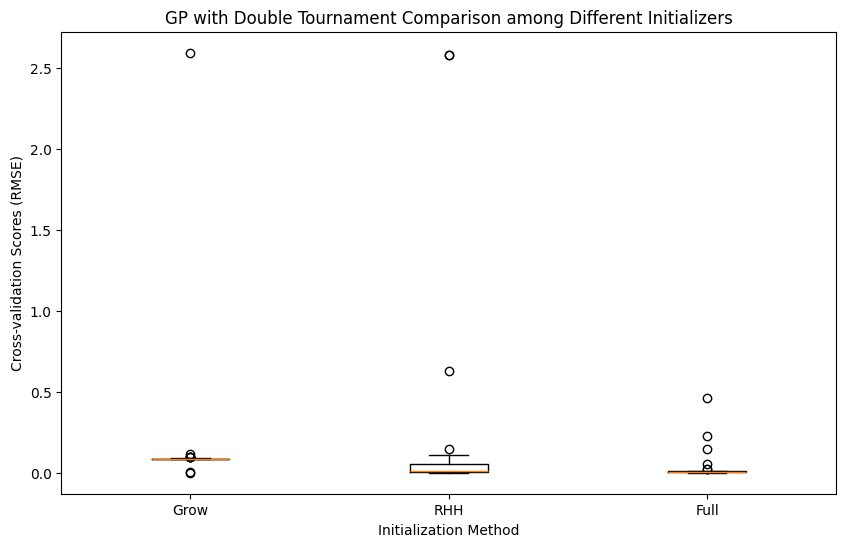

In [51]:
# Combine the scores into a list
data = [results_gp_double_tournament_grow, results_gp_double_tournament_rhh, results_gp_double_tournament_full]

# Labels for each method
labels = ['Grow', 'RHH', 'Full']

# Create the boxplot
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
plt.title('GP with Double Tournament Comparison among Different Initializers')
plt.ylabel('Cross-validation Scores (RMSE)')
plt.xlabel('Initialization Method')
plt.grid(False)
plt.show()

<a id='GSGP'></a>
# 4. Geometric Semantic Genetic Programming

In [52]:
seed = 42
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'mps' if torch.backends.mps.is_available() else 'cpu' #para mac
total_batches = 1

In [53]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values.flatten()

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div'] , function_map['exp'], function_map['log']]

sspace_sml_gs = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 3,
    'max_depth': 10, 
    'n_batches': 1,  
    'device': device
}

gsgp_params = {
    'sspace': sspace_sml_gs,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': device,
    'seed': 42
}

#Defining GSM steps:
to, by = 5.0, 0.25
ms = torch.arange(by, to + by, by, device=device)

def cross_val_gs_genetic_programming(X, y, cv=10, shuffle=True, random_state = 42,  **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        #initialize array where we will store scaled data
        X_scaled = np.empty_like(X)

        #split train and validation
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        #apply scaling on train and validation
        scaler = RobustScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        #add scaled data to the initial array
        X_scaled[train_index] = X_train_scaled
        X_scaled[val_index] = X_val_scaled

        #save indices as a tensor
        train_indices = torch.tensor(train_index, dtype=torch.long).to(gp_kwargs['device'])
        val_indices = torch.tensor(val_index, dtype=torch.long).to(gp_kwargs['device'])

        #save data as a tensor
        X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(gp_kwargs['device'])
        y_tensor = torch.tensor(y, dtype=torch.float32).to(gp_kwargs['device'])

        # Initialize genetic programming with the current fold's data
        pi_sml_gs = SMLGS(
            sspace=sspace_sml_gs,
            ffunction=Ffunctions('rmse'),
            X=X_tensor, y=y_tensor,
            train_indices=train_indices,
            test_indices=val_indices)

        mheuristic = GSGP( 
            pi=pi_sml_gs,
            #add if we want to reconsctruct:
            #path_init_pop=path_init_pop, 
            #path_rts=path_rts, 
            initializer=grow,
            selector=prm_tournament(gp_kwargs['selection_pressure']),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed'],
            crossover=prm_efficient_gs_xo(X_tensor, prm_grow(sspace=pi_sml_gs.sspace)),
            mutator=prm_efficient_gs_mtn(X_tensor, prm_grow(sspace=pi_sml_gs.sspace), ms) 
            #only store semantic of individuals so we need new genetic algorithms
)

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array([t.detach().cpu().numpy() for t in scores])

In [54]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gsgsp_grow = []

run_1 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 42
)

results_gsgsp_grow.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 25
)

results_gsgsp_grow.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 63
)

results_gsgsp_grow.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gsgsp_grow = list(itertools.chain.from_iterable(results_gsgsp_grow))

print("Cross-validation scores for all runs: ", results_gsgsp_grow)
print("Mean cross-validation score for all runs: ", np.mean(results_gsgsp_grow))

Cross-validation scores for run 1: [0.16142741 0.13936208 0.17470771 0.23570862 0.1773558  0.21017362
 0.14266491 0.19933338 0.13897026 0.21575072]
Mean cross-validation score: 0.17954545
Cross-validation scores for run 2: [0.22148766 0.1466242  0.23574154 0.19968735 0.19830789 0.14045523
 0.18337578 0.11007307 0.16886364 0.20820047]
Mean cross-validation score: 0.18128167
Cross-validation scores for run 3: [0.20775709 0.19781317 0.1784838  0.1154378  0.17786083 0.14163609
 0.27251914 0.1074954  0.0947182  0.22515738]
Mean cross-validation score: 0.17188789
Cross-validation scores for all runs:  [0.16142741, 0.13936208, 0.17470771, 0.23570862, 0.1773558, 0.21017362, 0.14266491, 0.19933338, 0.13897026, 0.21575072, 0.22148766, 0.1466242, 0.23574154, 0.19968735, 0.19830789, 0.14045523, 0.18337578, 0.110073075, 0.16886364, 0.20820047, 0.20775709, 0.19781317, 0.1784838, 0.1154378, 0.17786083, 0.14163609, 0.27251914, 0.1074954, 0.0947182, 0.22515738]
Mean cross-validation score for all runs:

**Changing parameters to optimize slightly:**

p_constants = 0.4<br>
max_init_depth = 2<br>
selection_pressure = 0.2<br>
mutation_prob = 0.3

In [55]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values.flatten()

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div'] , function_map['exp'], function_map['log']]

sspace_sml_gs = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.4,
    'max_init_depth': 2,
    'max_depth': 10, 
    'n_batches': 1,  
    'device': device
}

gsgp_params = {
    'sspace': sspace_sml_gs,
    'selection_pressure': 0.2,
    'mutation_prob': 0.3,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': device,
    'seed': 42
}

#Defining GSM steps:
to, by = 5.0, 0.25
ms = torch.arange(by, to + by, by, device=device)

def cross_val_gs_genetic_programming(X, y, cv=10, shuffle=True, random_state = 42, **gp_kwargs):
    
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        #initialize array where we will store scaled data
        X_scaled = np.empty_like(X)

        #split train and validation
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        #apply scaling on train and validation
        scaler = RobustScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        #add scaled data to the initial array
        X_scaled[train_index] = X_train_scaled
        X_scaled[val_index] = X_val_scaled

        #save indices as a tensor
        train_indices = torch.tensor(train_index, dtype=torch.long).to(gp_kwargs['device'])
        val_indices = torch.tensor(val_index, dtype=torch.long).to(gp_kwargs['device'])

        #save data as a tensor
        X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(gp_kwargs['device'])
        y_tensor = torch.tensor(y, dtype=torch.float32).to(gp_kwargs['device'])

        # Initialize genetic programming with the current fold's data
        pi_sml_gs = SMLGS(
            sspace=sspace_sml_gs,
            ffunction=Ffunctions('rmse'),
            X=X_tensor, y=y_tensor,
            train_indices=train_indices,
            test_indices=val_indices)

        mheuristic = GSGP( 
            pi=pi_sml_gs,
            #add if we want to reconsctruct:
            #path_init_pop=path_init_pop, 
            #path_rts=path_rts, 
            initializer=grow,
            selector=prm_tournament(gp_kwargs['selection_pressure']),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed'],
            crossover=prm_efficient_gs_xo(X_tensor, prm_grow(sspace=pi_sml_gs.sspace)),
            mutator=prm_efficient_gs_mtn(X_tensor, prm_grow(sspace=pi_sml_gs.sspace), ms) 
)

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array([t.detach().cpu().numpy() for t in scores])

In [56]:
# Initialize the results list
results_gsgsp_grow_optimized = []

# Perform K-Fold cross-validation with the genetic programming algorithm
run_1 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 42
)

results_gsgsp_grow_optimized.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

# Perform K-Fold cross-validation with the genetic programming algorithm
run_2 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 25
)

results_gsgsp_grow_optimized.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

# Perform K-Fold cross-validation with the genetic programming algorithm
run_3 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 63
)

results_gsgsp_grow_optimized.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gsgsp_grow_optimized = list(itertools.chain.from_iterable(results_gsgsp_grow_optimized))

print("Cross-validation scores for all runs: ", results_gsgsp_grow_optimized)
print("Mean cross-validation score for all runs: ", np.mean(results_gsgsp_grow_optimized))

Cross-validation scores for run 1: [0.06919065 0.06820968 0.06319376 0.06295585 0.06194712 0.13253559
 0.06664439 0.14691636 0.06278697 0.16000445]
Mean cross-validation score: 0.08943848
Cross-validation scores for run 2: [0.14582399 0.07033191 0.14352673 0.06132867 0.07010219 0.06211182
 0.13852659 0.14321253 0.14566353 0.16241285]
Mean cross-validation score: 0.11430408
Cross-validation scores for run 3: [0.14658622 0.06775679 0.14428812 0.06917781 0.06427719 0.06740413
 0.06134895 0.15870939 0.15442991 0.06553341]
Mean cross-validation score: 0.09995119
Cross-validation scores for all runs:  [0.06919065, 0.06820968, 0.06319376, 0.06295585, 0.06194712, 0.13253559, 0.066644385, 0.14691636, 0.06278697, 0.16000445, 0.14582399, 0.07033191, 0.14352673, 0.061328672, 0.070102185, 0.062111825, 0.13852659, 0.14321253, 0.14566353, 0.16241285, 0.14658622, 0.067756794, 0.14428812, 0.069177814, 0.06427719, 0.06740413, 0.061348952, 0.15870939, 0.15442991, 0.065533414]
Mean cross-validation score 

### Applying other initializations:

#### RHH initializations:

In [57]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values.flatten()

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div'] , function_map['exp'], function_map['log']]

sspace_sml_gs = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.4,
    'max_init_depth': 2,
    'max_depth': 10, 
    'n_batches': 1,  
    'device': device
}

gsgp_params = {
    'sspace': sspace_sml_gs,
    'selection_pressure': 0.2,
    'mutation_prob': 0.3,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': device,
    'seed': 42
}

#Defining GSM steps:
to, by = 5.0, 0.25
ms = torch.arange(by, to + by, by, device=device)

def cross_val_gs_genetic_programming(X, y, cv=10, shuffle=True, random_state = 42, **gp_kwargs):
    
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        #initialize array where we will store scaled data
        X_scaled = np.empty_like(X)

        #split train and validation
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        #apply scaling on train and validation
        scaler = RobustScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        #add scaled data to the initial array
        X_scaled[train_index] = X_train_scaled
        X_scaled[val_index] = X_val_scaled

        #save indices as a tensor
        train_indices = torch.tensor(train_index, dtype=torch.long).to(gp_kwargs['device'])
        val_indices = torch.tensor(val_index, dtype=torch.long).to(gp_kwargs['device'])

        #save data as a tensor
        X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(gp_kwargs['device'])
        y_tensor = torch.tensor(y, dtype=torch.float32).to(gp_kwargs['device'])

        # Initialize genetic programming with the current fold's data
        pi_sml_gs = SMLGS(
            sspace=sspace_sml_gs,
            ffunction=Ffunctions('rmse'),
            X=X_tensor, y=y_tensor,
            train_indices=train_indices,
            test_indices=val_indices)

        mheuristic = GSGP( 
            pi=pi_sml_gs,
            #add if we want to reconsctruct:
            #path_init_pop=path_init_pop, 
            #path_rts=path_rts, 
            initializer=rhh,
            selector=prm_tournament(gp_kwargs['selection_pressure']),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed'],
            crossover=prm_efficient_gs_xo(X_tensor, prm_grow(sspace=pi_sml_gs.sspace)),
            mutator=prm_efficient_gs_mtn(X_tensor, prm_grow(sspace=pi_sml_gs.sspace), ms) 
)

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array([t.detach().cpu().numpy() for t in scores])

In [58]:
# Initialize the results list
results_gsgsp_rhh = []

# Perform K-Fold cross-validation with the genetic programming algorithm
run_1 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 42
)

results_gsgsp_rhh.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 25
)

results_gsgsp_rhh.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 63
)

results_gsgsp_rhh.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gsgsp_rhh = list(itertools.chain.from_iterable(results_gsgsp_rhh))

print("Cross-validation scores for all runs: ", results_gsgsp_rhh)
print("Mean cross-validation score for all runs: ", np.mean(results_gsgsp_rhh))

Cross-validation scores for run 1: [0.18756692 0.19670177 0.19185461 0.1934478  0.1870664  0.18906228
 0.18800284 0.18528643 0.19100669 0.18984376]
Mean cross-validation score: 0.18998395
Cross-validation scores for run 2: [0.14402497 0.18829055 0.19276093 0.19071554 0.1770847  0.19445647
 0.1728636  0.12256686 0.1944584  0.18858951]
Mean cross-validation score: 0.17658114
Cross-validation scores for run 3: [0.19176936 0.18693246 0.19110143 0.1889952  0.19471295 0.18959932
 0.18926197 0.10959333 0.1190904  0.18489367]
Mean cross-validation score: 0.17459503
Cross-validation scores for all runs:  [0.18756692, 0.19670177, 0.19185461, 0.1934478, 0.1870664, 0.18906228, 0.18800284, 0.18528643, 0.19100669, 0.18984376, 0.14402497, 0.18829055, 0.19276093, 0.19071554, 0.1770847, 0.19445647, 0.1728636, 0.12256686, 0.1944584, 0.18858951, 0.19176936, 0.18693246, 0.19110143, 0.1889952, 0.19471295, 0.18959932, 0.18926197, 0.10959333, 0.1190904, 0.18489367]
Mean cross-validation score for all runs:  

#### FULL intializations:

In [59]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values.flatten()

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div'] , function_map['exp'], function_map['log']]

sspace_sml_gs = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.4,
    'max_init_depth': 2,
    'max_depth': 10, 
    'n_batches': 1,  
    'device': device
}

gsgp_params = {
    'sspace': sspace_sml_gs,
    'selection_pressure': 0.2,
    'mutation_prob': 0.3,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': device,
    'seed': 42
}

#Defining GSM steps:
to, by = 5.0, 0.25
ms = torch.arange(by, to + by, by, device=device)

def cross_val_gs_genetic_programming(X, y, cv=10, shuffle=True, random_state = 42, **gp_kwargs):
    
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        #initialize array where we will store scaled data
        X_scaled = np.empty_like(X)

        #split train and validation
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        #apply scaling on train and validation
        scaler = RobustScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        #add scaled data to the initial array
        X_scaled[train_index] = X_train_scaled
        X_scaled[val_index] = X_val_scaled

        #save indices as a tensor
        train_indices = torch.tensor(train_index, dtype=torch.long).to(gp_kwargs['device'])
        val_indices = torch.tensor(val_index, dtype=torch.long).to(gp_kwargs['device'])

        #save data as a tensor
        X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(gp_kwargs['device'])
        y_tensor = torch.tensor(y, dtype=torch.float32).to(gp_kwargs['device'])

        # Initialize genetic programming with the current fold's data
        pi_sml_gs = SMLGS(
            sspace=sspace_sml_gs,
            ffunction=Ffunctions('rmse'),
            X=X_tensor, y=y_tensor,
            train_indices=train_indices,
            test_indices=val_indices)

        mheuristic = GSGP( 
            pi=pi_sml_gs,
            #add if we want to reconsctruct:
            #path_init_pop=path_init_pop, 
            #path_rts=path_rts, 
            initializer=full,
            selector=prm_tournament(gp_kwargs['selection_pressure']),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed'],
            crossover=prm_efficient_gs_xo(X_tensor, prm_grow(sspace=pi_sml_gs.sspace)),
            mutator=prm_efficient_gs_mtn(X_tensor, prm_grow(sspace=pi_sml_gs.sspace), ms) 
)

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array([t.detach().cpu().numpy() for t in scores])

In [60]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gsgsp_full = []

run_1 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 42
)

results_gsgsp_full.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 25
)


results_gsgsp_full.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 63
)

results_gsgsp_full.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gsgsp_full = list(itertools.chain.from_iterable(results_gsgsp_full))

print("Cross-validation scores for all runs: ", results_gsgsp_full)
print("Mean cross-validation score for all runs: ", np.mean(results_gsgsp_full))

Cross-validation scores for run 1: [0.20213425 0.10834539 0.10945994 0.11405835 0.1112104  0.23237652
 0.06847372 0.22290795 0.09081583 0.23766112]
Mean cross-validation score: 0.14974435
Cross-validation scores for run 2: [0.22747755 0.06934604 0.18465094 0.07241219 0.0718564  0.07287286
 0.21740961 0.23687483 0.23120914 0.22904445]
Mean cross-validation score: 0.16131541
Cross-validation scores for run 3: [0.17768899 0.10894733 0.22742963 0.07135418 0.14208475 0.07043084
 0.0875114  0.22878712 0.13964556 0.0934425 ]
Mean cross-validation score: 0.13473222
Cross-validation scores for all runs:  [0.20213425, 0.10834539, 0.109459944, 0.11405835, 0.1112104, 0.23237652, 0.06847372, 0.22290795, 0.090815835, 0.23766112, 0.22747755, 0.06934604, 0.18465094, 0.07241219, 0.0718564, 0.07287286, 0.21740961, 0.23687483, 0.23120914, 0.22904445, 0.17768899, 0.10894733, 0.22742963, 0.07135418, 0.14208475, 0.07043084, 0.0875114, 0.22878712, 0.13964556, 0.0934425]
Mean cross-validation score for all ru

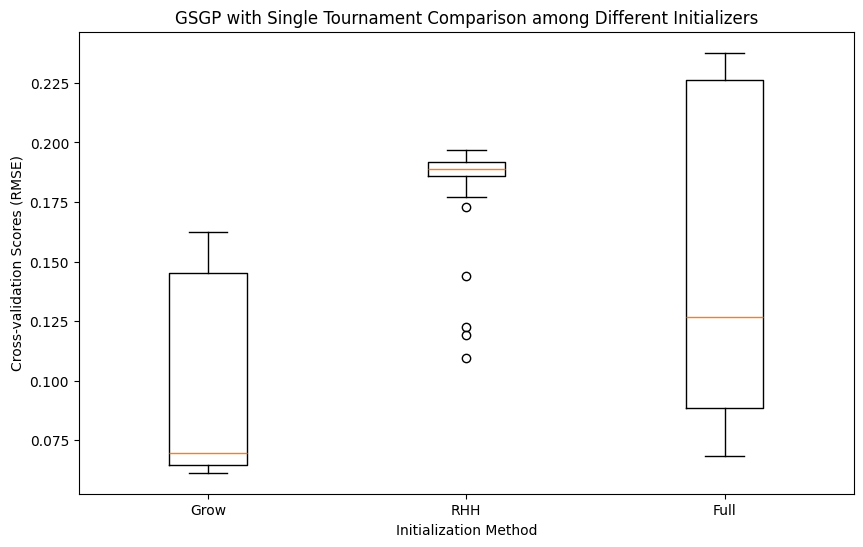

In [61]:
# Combine the scores into a list
data = [results_gsgsp_grow_optimized, results_gsgsp_rhh, results_gsgsp_full]

# Labels for each method
labels = ['Grow', 'RHH', 'Full']

# Create the boxplot
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
plt.title('GSGP with Single Tournament Comparison among Different Initializers')
plt.ylabel('Cross-validation Scores (RMSE)')
plt.xlabel('Initialization Method')
plt.grid(False)
plt.show()

## GSGP Double Tournament Selection

### Grow Initializations

In [62]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values.flatten()

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div'] , function_map['exp'], function_map['log']]

sspace_sml_gs = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.4,
    'max_init_depth': 2,
    'max_depth': 10, 
    'n_batches': 1,  
    'device': device
}

gsgp_params = {
    'sspace': sspace_sml_gs,
    'selection_pressure': 0.2,
    'mutation_prob': 0.3,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': device,
    'seed': 42
}

#Defining GSM steps:
to, by = 5.0, 0.25
ms = torch.arange(by, to + by, by, device=device)

def cross_val_gs_genetic_programming(X, y, cv=10, shuffle=True, random_state = 42, **gp_kwargs):
    
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        #initialize array where we will store scaled data
        X_scaled = np.empty_like(X)

        #split train and validation
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        #apply scaling on train and validation
        scaler = RobustScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        #add scaled data to the initial array
        X_scaled[train_index] = X_train_scaled
        X_scaled[val_index] = X_val_scaled

        #save indices as a tensor
        train_indices = torch.tensor(train_index, dtype=torch.long).to(gp_kwargs['device'])
        val_indices = torch.tensor(val_index, dtype=torch.long).to(gp_kwargs['device'])

        #save data as a tensor
        X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(gp_kwargs['device'])
        y_tensor = torch.tensor(y, dtype=torch.float32).to(gp_kwargs['device'])

        # Initialize genetic programming with the current fold's data
        pi_sml_gs = SMLGS(
            sspace=sspace_sml_gs,
            ffunction=Ffunctions('rmse'),
            X=X_tensor, y=y_tensor,
            train_indices=train_indices,
            test_indices=val_indices)

        mheuristic = GSGP( 
            pi=pi_sml_gs,
            #add if we want to reconsctruct:
            #path_init_pop=path_init_pop, 
            #path_rts=path_rts, 
            initializer=grow,
            selector=prm_double_tournament(gp_kwargs['selection_pressure']),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed'],
            crossover=prm_efficient_gs_xo(X_tensor, prm_grow(sspace=pi_sml_gs.sspace)),
            mutator=prm_efficient_gs_mtn(X_tensor, prm_grow(sspace=pi_sml_gs.sspace), ms) 
)

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array([t.detach().cpu().numpy() for t in scores])

In [63]:
# Initialize the results list
results_gsgsp_double_grow = []

# Perform K-Fold cross-validation with the genetic programming algorithm
run_1 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 42
)

results_gsgsp_double_grow.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

# Perform K-Fold cross-validation with the genetic programming algorithm
run_2 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 25
)

results_gsgsp_double_grow.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

# Perform K-Fold cross-validation with the genetic programming algorithm
run_3 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 63
)

results_gsgsp_double_grow.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gsgsp_double_grow = list(itertools.chain.from_iterable(results_gsgsp_double_grow))

print("Cross-validation scores for all runs: ", results_gsgsp_double_grow)
print("Mean cross-validation score for all runs: ", np.mean(results_gsgsp_double_grow))

Cross-validation scores for run 1: [0.1665833  0.16995665 0.16528349 0.1519766  0.17051505 0.14007519
 0.16340932 0.13699108 0.16520037 0.13589802]
Mean cross-validation score: 0.1565889
Cross-validation scores for run 2: [0.14197862 0.15630381 0.14685008 0.15356918 0.15780571 0.16508584
 0.14230825 0.13205437 0.1415312  0.14303085]
Mean cross-validation score: 0.1480518
Cross-validation scores for run 3: [0.14381973 0.15635698 0.13556966 0.1616084  0.16696039 0.16234191
 0.15456687 0.14152247 0.1402064  0.1643032 ]
Mean cross-validation score: 0.15272559
Cross-validation scores for all runs:  [0.1665833, 0.16995665, 0.16528349, 0.1519766, 0.17051505, 0.14007519, 0.16340932, 0.13699108, 0.16520037, 0.13589802, 0.14197862, 0.15630381, 0.14685008, 0.15356918, 0.15780571, 0.16508584, 0.14230825, 0.13205437, 0.1415312, 0.14303085, 0.14381973, 0.15635698, 0.13556966, 0.1616084, 0.16696039, 0.16234191, 0.15456687, 0.14152247, 0.1402064, 0.1643032]
Mean cross-validation score for all runs:  0

#### RHH initializations:

In [64]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values.flatten()

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div'] , function_map['exp'], function_map['log']]

sspace_sml_gs = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.4,
    'max_init_depth': 2,
    'max_depth': 10, 
    'n_batches': 1,  
    'device': device
}

gsgp_params = {
    'sspace': sspace_sml_gs,
    'selection_pressure': 0.2,
    'mutation_prob': 0.3,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': device,
    'seed': 42
}

#Defining GSM steps:
to, by = 5.0, 0.25
ms = torch.arange(by, to + by, by, device=device)

def cross_val_gs_genetic_programming(X, y, cv=10, shuffle=True, random_state = 42, **gp_kwargs):
    
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        #initialize array where we will store scaled data
        X_scaled = np.empty_like(X)

        #split train and validation
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        #apply scaling on train and validation
        scaler = RobustScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        #add scaled data to the initial array
        X_scaled[train_index] = X_train_scaled
        X_scaled[val_index] = X_val_scaled

        #save indices as a tensor
        train_indices = torch.tensor(train_index, dtype=torch.long).to(gp_kwargs['device'])
        val_indices = torch.tensor(val_index, dtype=torch.long).to(gp_kwargs['device'])

        #save data as a tensor
        X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(gp_kwargs['device'])
        y_tensor = torch.tensor(y, dtype=torch.float32).to(gp_kwargs['device'])

        # Initialize genetic programming with the current fold's data
        pi_sml_gs = SMLGS(
            sspace=sspace_sml_gs,
            ffunction=Ffunctions('rmse'),
            X=X_tensor, y=y_tensor,
            train_indices=train_indices,
            test_indices=val_indices)

        mheuristic = GSGP( 
            pi=pi_sml_gs,
            #add if we want to reconsctruct:
            #path_init_pop=path_init_pop, 
            #path_rts=path_rts, 
            initializer=rhh,
            selector=prm_double_tournament(gp_kwargs['selection_pressure']),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed'],
            crossover=prm_efficient_gs_xo(X_tensor, prm_grow(sspace=pi_sml_gs.sspace)),
            mutator=prm_efficient_gs_mtn(X_tensor, prm_grow(sspace=pi_sml_gs.sspace), ms) 
)

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array([t.detach().cpu().numpy() for t in scores])

In [65]:
# Initialize the results list
results_gsgsp_double_rhh = []

# Perform K-Fold cross-validation with the genetic programming algorithm
run_1 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 42
)

results_gsgsp_double_rhh.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 25
)

results_gsgsp_double_rhh.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 63
)

results_gsgsp_double_rhh.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gsgsp_double_rhh = list(itertools.chain.from_iterable(results_gsgsp_double_rhh))

print("Cross-validation scores for all runs: ", results_gsgsp_double_rhh)
print("Mean cross-validation score for all runs: ", np.mean(results_gsgsp_double_rhh))

Cross-validation scores for run 1: [0.2300733  0.2427795  0.24842215 0.20443209 0.24322113 0.15472329
 0.25227845 0.17882414 0.24926059 0.17226098]
Mean cross-validation score: 0.21762756
Cross-validation scores for run 2: [0.3063339  0.24486534 0.18504779 0.24702537 0.22736734 0.24355586
 0.23465878 0.25278616 0.3009377  0.31628838]
Mean cross-validation score: 0.25588667
Cross-validation scores for run 3: [0.1621192  0.25040793 0.31162333 0.2473164  0.27200833 0.19705687
 0.21260698 0.2962608  0.3641108  0.24800949]
Mean cross-validation score: 0.256152
Cross-validation scores for all runs:  [0.2300733, 0.2427795, 0.24842215, 0.20443209, 0.24322113, 0.15472329, 0.25227845, 0.17882414, 0.24926059, 0.17226098, 0.3063339, 0.24486534, 0.18504779, 0.24702537, 0.22736734, 0.24355586, 0.23465878, 0.25278616, 0.3009377, 0.31628838, 0.1621192, 0.25040793, 0.31162333, 0.2473164, 0.27200833, 0.19705687, 0.21260698, 0.2962608, 0.3641108, 0.24800949]
Mean cross-validation score for all runs:  0.2

#### FULL intializations:

In [66]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values.flatten()

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div'] , function_map['exp'], function_map['log']]

sspace_sml_gs = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.4,
    'max_init_depth': 2,
    'max_depth': 10, 
    'n_batches': 1,  
    'device': device
}

gsgp_params = {
    'sspace': sspace_sml_gs,
    'selection_pressure': 0.2,
    'mutation_prob': 0.3,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': device,
    'seed': 42
}

#Defining GSM steps:
to, by = 5.0, 0.25
ms = torch.arange(by, to + by, by, device=device)

def cross_val_gs_genetic_programming(X, y, cv=10, shuffle=True, random_state = 42, **gp_kwargs):
    
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        #initialize array where we will store scaled data
        X_scaled = np.empty_like(X)

        #split train and validation
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        #apply scaling on train and validation
        scaler = RobustScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        #add scaled data to the initial array
        X_scaled[train_index] = X_train_scaled
        X_scaled[val_index] = X_val_scaled

        #save indices as a tensor
        train_indices = torch.tensor(train_index, dtype=torch.long).to(gp_kwargs['device'])
        val_indices = torch.tensor(val_index, dtype=torch.long).to(gp_kwargs['device'])

        #save data as a tensor
        X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(gp_kwargs['device'])
        y_tensor = torch.tensor(y, dtype=torch.float32).to(gp_kwargs['device'])

        # Initialize genetic programming with the current fold's data
        pi_sml_gs = SMLGS(
            sspace=sspace_sml_gs,
            ffunction=Ffunctions('rmse'),
            X=X_tensor, y=y_tensor,
            train_indices=train_indices,
            test_indices=val_indices)

        mheuristic = GSGP( 
            pi=pi_sml_gs,
            #add if we want to reconsctruct:
            #path_init_pop=path_init_pop, 
            #path_rts=path_rts, 
            initializer=full,
            selector=prm_double_tournament(gp_kwargs['selection_pressure']),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed'],
            crossover=prm_efficient_gs_xo(X_tensor, prm_grow(sspace=pi_sml_gs.sspace)),
            mutator=prm_efficient_gs_mtn(X_tensor, prm_grow(sspace=pi_sml_gs.sspace), ms) 
)

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array([t.detach().cpu().numpy() for t in scores])

In [67]:
# Perform K-Fold cross-validation with the genetic programming algorithm
# Perform 3 times with shuffle=True and different random states to have 30 trials and statistical significance

# Initialize the results list
results_gsgsp_double_full = []

run_1 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 42
)

results_gsgsp_double_full.append(run_1)

print("Cross-validation scores for run 1:", run_1)
print("Mean cross-validation score:", np.mean(run_1))

del run_1
gc.collect()

run_2 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 25
)


results_gsgsp_double_full.append(run_2)

print("Cross-validation scores for run 2:", run_2)
print("Mean cross-validation score:", np.mean(run_2))

del run_2
gc.collect()

run_3 = cross_val_gs_genetic_programming(
    X=X,
    y=y,
    **gsgp_params,
    shuffle = True,
    random_state = 63
)

results_gsgsp_double_full.append(run_3)

print("Cross-validation scores for run 3:", run_3)
print("Mean cross-validation score:", np.mean(run_3))

del run_3
gc.collect()

results_gsgsp_double_full = list(itertools.chain.from_iterable(results_gsgsp_double_full))

print("Cross-validation scores for all runs: ", results_gsgsp_double_full)
print("Mean cross-validation score for all runs: ", np.mean(results_gsgsp_double_full))

Cross-validation scores for run 1: [0.1327279  0.22187622 0.1732881  0.13138744 0.22600493 0.25909874
 0.19107513 0.21773526 0.23834652 0.21138908]
Mean cross-validation score: 0.20029294
Cross-validation scores for run 2: [0.1892075  0.23964691 0.11584513 0.21954966 0.26338995 0.24187307
 0.10253242 0.21538013 0.17643547 0.24764633]
Mean cross-validation score: 0.20115066
Cross-validation scores for run 3: [0.19803765 0.22060537 0.1694205  0.17415637 0.13565016 0.2261272
 0.19544493 0.22214626 0.30413848 0.22271048]
Mean cross-validation score: 0.20684373
Cross-validation scores for all runs:  [0.1327279, 0.22187622, 0.1732881, 0.13138744, 0.22600493, 0.25909874, 0.19107513, 0.21773526, 0.23834652, 0.21138908, 0.1892075, 0.23964691, 0.11584513, 0.21954966, 0.26338995, 0.24187307, 0.102532424, 0.21538013, 0.17643547, 0.24764633, 0.19803765, 0.22060537, 0.1694205, 0.17415637, 0.13565016, 0.2261272, 0.19544493, 0.22214626, 0.30413848, 0.22271048]
Mean cross-validation score for all runs:

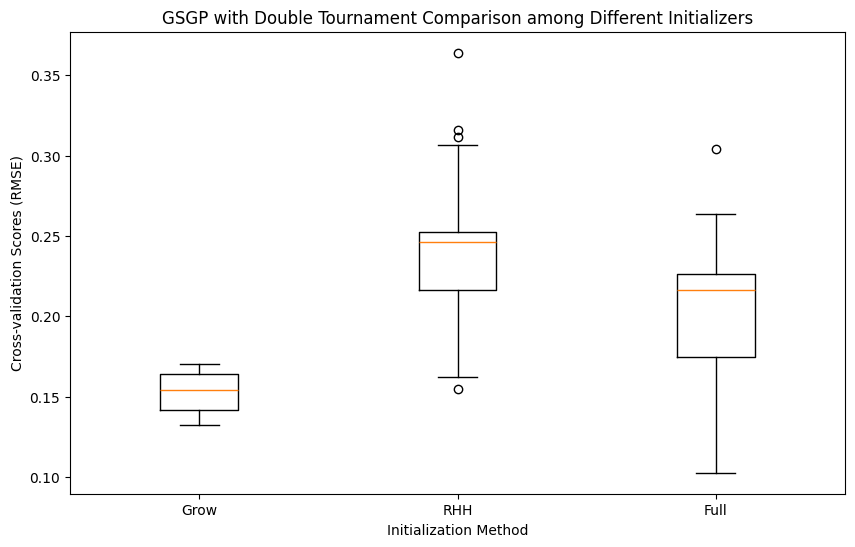

In [68]:
# Combine the scores into a list
data = [results_gsgsp_double_grow, results_gsgsp_double_rhh, results_gsgsp_double_full]

# Labels for each method
labels = ['Grow', 'RHH', 'Full']

# Create the boxplot
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
plt.title('GSGP with Double Tournament Comparison among Different Initializers')
plt.ylabel('Cross-validation Scores (RMSE)')
plt.xlabel('Initialization Method')
plt.grid(False)
plt.show()

<a id='Neural-Networks'></a>
# 5. Neural Networks

#### **Using PyTorch**

In [69]:
#Prepare the data
seed = 42
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'mps' if torch.backends.mps.is_available() else 'cpu' #para mac
#total_batches = 1

# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values.flatten()

# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32)

dataset = TensorDataset(X_tensor, y_tensor)

In [70]:
#Define the Neural Network: simple feed-foward NN with one hidden layer
class RegressionNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        #Instanciate the parent (nn.Module) class
        super(RegressionNN, self).__init__()
        #1) NN architeture definition
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_dim, output_dim)

        #self.apply(self._init_weights) #apply the function in 2)
    
    #2) Weights and bias initialization: 
    def _init_weights(self, attribute):
        if isinstance(attribute, nn.Linear):
          torch.nn.init.xavier_uniform_(attribute.weight)#the variance of the weights will be the same for all layers
          torch.nn.init.zeros_(attribute.bias) #bias are initialized as zero   
    
    #3) Foward pass
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        return out


#### Working with functions that take into consideration Loss and RMSE calculations:

In [71]:
#4) Training Fucntion

#w/ RMSE
def train_model(model, criterion, optimizer, dataloader):
    model.train()
    total_loss = 0
    total_rmse = 0
    for inputs, targets in dataloader:
        targets = targets.view(-1, 1)  # Reshape targets to match model output
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        # Calculate RMSE
        rmse = torch.sqrt(F.mse_loss(outputs, targets))
        total_rmse += rmse.item()
    avg_loss = total_loss / len(dataloader)
    avg_rmse = total_rmse / len(dataloader)
    return avg_loss, avg_rmse

#5) Evaluation Function

#w/ RMSE
def evaluate_model(model, criterion, dataloader):
    model.eval()
    total_loss = 0
    total_rmse = 0
    with torch.no_grad():
        for inputs, targets in dataloader:
            targets = targets.view(-1, 1)  # Reshape targets to match model output
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            total_loss += loss.item()
            # Calculate RMSE
            rmse = torch.sqrt(F.mse_loss(outputs, targets))
            total_rmse += rmse.item()
    avg_loss = total_loss / len(dataloader)
    avg_rmse = total_rmse / len(dataloader)
    return avg_loss, avg_rmse

In [72]:
def cross_validate(dataset, k_folds=10, epochs=500, batch_size=16, learning_rate=0.001, random_state=42):
    kf = KFold(n_splits=k_folds, shuffle=True, random_state=random_state)
    fold_results = {}

    nn_names = ['SGD', 'MiniSGD', 'ASGD', 'RMSprop']
    for nn_name in nn_names:
        fold_results[nn_name] = {'losses': [], 'median_losses': [], 'train_rmse': [], 'val_rmse': [], 'median_rmse_train': [], 'median_rmse_val': []}

    for fold, (train_idx, val_idx) in enumerate(kf.split(dataset)):
        train_subset = torch.utils.data.Subset(dataset, train_idx)
        val_subset = torch.utils.data.Subset(dataset, val_idx)
        
        train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)
        
        input_dim = dataset.tensors[0].shape[1]
        hidden_dim = 20
        output_dim = 1
        
        models = {k: RegressionNN(input_dim, hidden_dim, output_dim) for k in nn_names}
        criterion = nn.MSELoss()
        optimizers = {
            'SGD': torch.optim.SGD(models['SGD'].parameters(), lr=learning_rate),
            'MiniSGD': torch.optim.SGD(models['MiniSGD'].parameters(), lr=learning_rate),
            'ASGD': torch.optim.ASGD(models['ASGD'].parameters(), lr=learning_rate),
            'RMSprop': torch.optim.RMSprop(models['RMSprop'].parameters(), lr=learning_rate)
        }

        for nn_name in fold_results.keys():
            models[nn_name].apply(models[nn_name]._init_weights)  # Ensure weights are initialized
            epoch_losses = []
            train_rmse = []
            validation_rmse=[]
            for epoch in range(epochs):
                train_loss, rmse = train_model(models[nn_name], criterion, optimizers[nn_name], train_loader)
                val_loss, val_rmse = evaluate_model(models[nn_name], criterion, val_loader)
                epoch_losses.append(val_loss)
                train_rmse.append(rmse)
                validation_rmse.append(val_rmse)

            fold_results[nn_name]['train_rmse'].append(train_rmse)
            fold_results[nn_name]['val_rmse'].append(validation_rmse) 
            fold_results[nn_name]['losses'].append(epoch_losses)
    
    for nn_name, results in fold_results.items():
        median_losses = np.median(np.array(results['losses']), axis=0)
        fold_results[nn_name]['median_losses'] = median_losses
        median_rmse_val = np.median(np.array(results['val_rmse']), axis=0)
        fold_results[nn_name]['median_rmse_val'] = median_rmse_val  
        median_rmse_train = np.median(np.array(results['train_rmse']), axis=0)
        fold_results[nn_name]['median_rmse_train'] = median_rmse_train  
    return fold_results

In [73]:
# Execute cross-validation. At this stage we're figuring out which of the optimizers performs best
results_2 = cross_validate(dataset)

In [74]:
minisgd=[]
asgd=[]
rmsprop=[]
sgd=[]


for i in range(10):
    minisgd.append(results_2.get('MiniSGD').get('train_rmse')[i][-1])
    asgd.append(results_2.get('ASGD').get('train_rmse')[i][-1])
    rmsprop.append(results_2.get('RMSprop').get('train_rmse')[i][-1])
    sgd.append(results_2.get('SGD').get('train_rmse')[i][-1])

In [75]:
np.mean(minisgd), np.mean(asgd), np.mean(rmsprop), np.mean(sgd)

(0.22856130417436363,
 0.21678329724818468,
 1.0536395159363745,
 0.15184645131230354)

In [76]:
min(np.mean(minisgd), np.mean(asgd), np.mean(rmsprop), np.mean(sgd))

0.15184645131230354

Best is SGD according to `rmse`. We will use that as our final NN model.

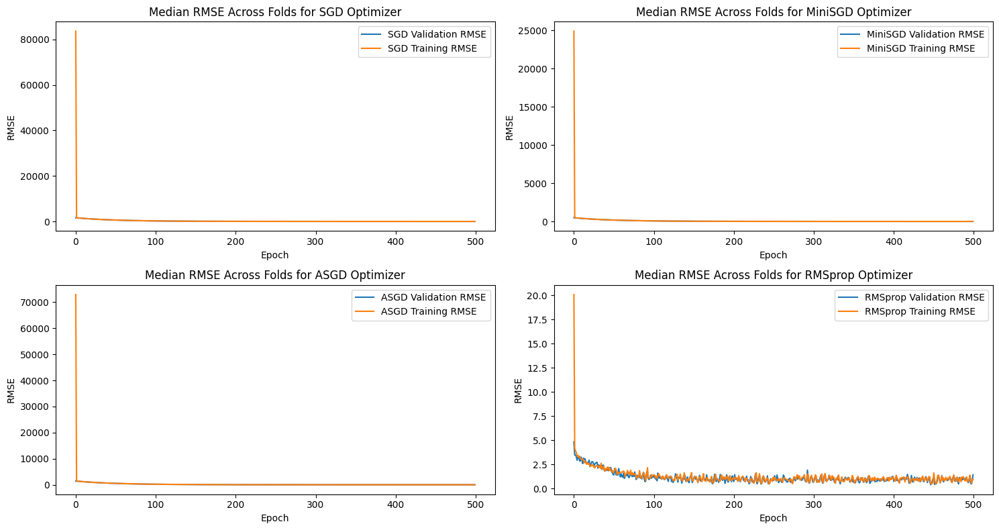

In [77]:
#LEARNING RATE : 0.000001, 500 epochs
nn_names = list(results_2.keys())
num_plots = len(nn_names)
num_cols = 2
num_rows = (num_plots + 1) // num_cols

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 8))

for i, nn_name in enumerate(nn_names):
    row = i // num_cols
    col = i % num_cols
    if num_rows > 1:
        ax = axs[row, col]
    else:
        ax = axs[col]
    
    median_rmse_val = results_2[nn_name]['median_rmse_val']
    median_rmse_train = results_2[nn_name]['median_rmse_train']
    
    ax.plot(median_rmse_val, label=f'{nn_name} Validation RMSE')
    ax.plot(median_rmse_train, label=f'{nn_name} Training RMSE')
    
    ax.set_xlabel('Epoch')
    ax.set_ylabel('RMSE')
    ax.legend()
    ax.set_title(f'Median RMSE Across Folds for {nn_name} Optimizer')

plt.tight_layout()
plt.show()

They basically all converge straight away....

Running NN SGD 30 trials

In [78]:
results_nn = []

a = 0
b = 0
c = 0

run_1 = cross_validate(dataset, random_state = 42)

for i in range(10):

    a = run_1.get('SGD').get('train_rmse')[i][-1]
    results_nn.append(a)

print("Cross-validation scores for run 1:", results_nn)
print("Mean cross-validation score:", np.mean(results_nn))


del run_1
gc.collect()

run_2 = cross_validate(dataset, random_state = 42)

for i in range(10):

    b = run_2.get('SGD').get('train_rmse')[i][-1]
    results_nn.append(b)

print("Cross-validation scores for run 2:", results_nn[10:20])
print("Mean cross-validation score for run 2:", np.mean(results_nn[10:20]))


del run_2
gc.collect()


run_3 = cross_validate(dataset, random_state = 42)

for i in range(10):

    c = run_3.get('SGD').get('train_rmse')[i][-1]
    results_nn.append(c)

print("Cross-validation scores for run 1:", results_nn[21:30])
print("Mean cross-validation score:", np.mean(results_nn[21:30]))


del run_3
gc.collect()


print("Cross-validation scores for all runs: ", results_nn)
print("Mean cross-validation score for all runs: ", np.mean(results_nn))

Cross-validation scores for run 1: [0.20871215909719468, 0.06434727273881435, 0.06571685746312142, 0.0629822075366974, 0.3496130704879761, 0.38442668318748474, 0.10805426761507989, 0.0812776580452919, 0.08773290850222111, 0.06403698697686196]
Mean cross-validation score: 0.14769000716507436
Cross-validation scores for run 2: [0.11349569633603096, 0.9814033448696137, 0.0734501414000988, 0.1780591666698456, 0.10558877289295196, 0.36284488439559937, 2.190113973617554, 4.17493782043457, 1.5907501101493835, 0.18202198445796966]
Mean cross-validation score for run 2: 0.9952665895223618
Cross-validation scores for run 1: [0.06466595903038978, 0.16750582456588745, 0.2809076517820358, 0.07564040645956993, 0.06135126799345016, 0.10449615269899368, 0.0795690432190895, 0.06362922675907612, 0.4776715785264969]
Mean cross-validation score: 0.1528263456705544
Cross-validation scores for all runs:  [0.20871215909719468, 0.06434727273881435, 0.06571685746312142, 0.0629822075366974, 0.3496130704879761, 

<a id='NEAT'></a>
# 6. NEAT

#### Running NEAT with train_test split. We were not able to perform NEAT using K-Folds.

In [79]:
train = pd.read_csv("train_preprocessed.csv")

In [80]:
X_train, X_test, y_train, y_test = train_test_split(train, y_lactose, test_size=0.3, random_state=42)

In [81]:
print(f'Train shape {X_train.shape}')
print(f'Test shape {X_test.shape}')

print(f'Train target shape {y_train.shape}')
print(f'Test target shape {y_test.shape}')

Train shape (123, 19)
Test shape (54, 19)
Train target shape (123, 1)
Test target shape (54, 1)


In [82]:
Scaler = RobustScaler()

In [83]:
# Identify the non one-hot encoded features (continuous features)
continuous_features = ['delivery_age_years', 'dry_days', 'forage_kg_day', 'rumination_min_day',
                       'milk_kg_day', 'milk_kg_min_robot', 'milkings_day', 'errors_by_100_milkings',
                       'high_cdt_by_100_milkings', 'watery_by_100_milkings', 'refusals_by_milking', 'colostrum_separated_kg']

# Apply RobustScaler to the continuous features
scaler = RobustScaler()

# Fit the scaler on the training data and transform the train, validation, and test data
X_train_continuous = scaler.fit_transform(X_train[continuous_features])
X_test_continuous = scaler.transform(X_test[continuous_features])

# Replace the continuous features in the original datasets with the scaled values
X_train[continuous_features] = X_train_continuous
X_test[continuous_features] = X_test_continuous

In [84]:
# Verify the transformation
print("Transformed training set:")
X_train.head()

Transformed training set:


,delivery_age_years,dry_days,forage_kg_day,rumination_min_day,milk_kg_day,milk_kg_min_robot,milkings_day,errors_by_100_milkings,high_cdt_by_100_milkings,watery_by_100_milkings,refusals_by_milking,colostrum_separated_kg,lactation_2,lactation_3,lactation_4,lactation_5,lactation_6,lactation_7,lactation_8
128,-0.177778,0.000000,-0.605490,-2.515543,-1.315585,0.169848,1.145565,-0.408083,0.0,0.0,3.493467,0.258706,1,0,0,0,0,0,0
104,-0.311111,0.526316,0.395571,-0.026134,0.400223,-0.032972,0.323913,-0.408083,0.0,0.0,-0.239995,-0.182421,1,0,0,0,0,0,0
78,0.311111,-0.105263,0.675962,-0.055603,0.158097,0.157300,0.470056,1.013705,0.0,0.0,0.216541,0.321725,0,1,0,0,0,0,0
36,0.311111,-0.421053,1.293534,-0.849739,0.608584,-0.026363,0.609146,0.443620,0.0,0.0,0.372283,1.124378,0,1,0,0,0,0,0
93,0.311111,0.842105,-0.248765,0.306088,0.467258,-0.895384,-0.673358,-0.090395,0.0,0.0,-0.258607,-0.467662,0,1,0,0,0,0,0


In [85]:
print("Transformed test set:")
X_test.head()

Transformed test set:


,delivery_age_years,dry_days,forage_kg_day,rumination_min_day,milk_kg_day,milk_kg_min_robot,milkings_day,errors_by_100_milkings,high_cdt_by_100_milkings,watery_by_100_milkings,refusals_by_milking,colostrum_separated_kg,lactation_2,lactation_3,lactation_4,lactation_5,lactation_6,lactation_7,lactation_8
19,0.533333,-4.631579,-0.439382,-2.046404,-1.392813,0.234416,0.784213,0.401805,0.000000,0.000000,1.014850,1.117745,0,1,0,0,0,0,0
45,0.444444,0.842105,0.044291,0.151622,-0.336758,-0.276047,-0.224027,-0.156346,0.000000,0.000000,-0.230131,-0.467662,0,1,0,0,0,0,0
139,-0.133333,-0.421053,-0.318766,-0.009403,0.189451,-0.717886,0.414665,0.346365,0.000000,0.000000,0.419292,-0.069652,1,0,0,0,0,0,0
30,1.333333,0.315789,-0.852656,0.425982,0.061661,0.208386,-0.517140,-0.280764,0.128041,0.640205,-0.426474,-0.036484,0,0,0,1,0,0,0
67,-0.177778,2.421053,0.688134,-0.530314,-0.206059,0.317644,0.273773,3.660922,0.000000,0.639386,0.409146,-0.467662,1,0,0,0,0,0,0


In [86]:
X_train = X_train.values
X_test = X_test.values

y_train = y_train.values
y_test = y_test.values

In [87]:
config_file = 'config-feedforward-xor'

In [88]:
# Open the config file with the correct encoding
with open(config_file, encoding='utf-8') as f:
    content = f.read()

In [89]:
config = neat.Config(neat.DefaultGenome, neat.DefaultReproduction,
                     neat.DefaultSpeciesSet, neat.DefaultStagnation,
                     config_file)

In [90]:
def eval_rmse(net, X, y):
    '''
    Auxiliary function to evaluate the RMSE.
    '''
    fit = 0.
    for xi, xo in zip(X, y):
        output = net.activate(xi)
        fit += (output[0] - xo)**2
        
    # RMSE
    return (fit / len(y))**0.5


def eval_genomes(genomes, config):
    '''
    The function used by NEAT-Python to evaluate the fitness of the genomes.
    -> It has to have the two first arguments equals to the genomes and config objects.
    -> It has to update the `fitness` attribute of the genome.
    '''
    for genome_id, genome in genomes:
        
        # Define the network
        net = neat.nn.FeedForwardNetwork.create(genome, config)
        
        # Train fitness
        train_rmse = eval_rmse(net, X_train, y_train)
        
        #Test fitness
        test_rmse = eval_rmse(net, X_test, y_test)

        # Ensure fitness is a scalar value
        genome.fitness = float(-test_rmse)

In [91]:
# Create the population, which is the top-level object for a NEAT run.
pop = neat.Population(config)

#### Running NEAT 30 times

In [92]:
# Add a stdout reporter to show progress in the terminal.
pop.add_reporter(neat.StdOutReporter(True))
stats = neat.StatisticsReporter()
pop.add_reporter(stats)
pop.add_reporter(neat.Checkpointer(200))

In [93]:
results = []  # List to store the results of each iteration

for i in range(30):
    # Split the data with a new random state each time
    X_train, X_test, y_train, y_test = train_test_split(train, y_lactose, test_size=0.3, random_state=i)

    # Define the continuous features
    continuous_features = ['delivery_age_years', 'dry_days', 'forage_kg_day', 'rumination_min_day',
                           'milk_kg_day', 'milk_kg_min_robot', 'milkings_day', 'errors_by_100_milkings',
                           'high_cdt_by_100_milkings', 'watery_by_100_milkings', 'refusals_by_milking', 'colostrum_separated_kg']
    
    # Apply RobustScaler to the continuous features
    scaler = RobustScaler()
    
    # Fit the scaler on the training data and transform the train, validation, and test data
    X_train_continuous = scaler.fit_transform(X_train[continuous_features])
    X_test_continuous = scaler.transform(X_test[continuous_features])
    
    # Replace the continuous features in the original datasets with the scaled values
    X_train[continuous_features] = X_train_continuous
    X_test[continuous_features] = X_test_continuous
    
    # Convert dataframe to numpy array
    X_train = X_train.values
    X_test = X_test.values
    y_train = y_train.values
    y_test = y_test.values
    
    winner = pop.run(eval_genomes, 100)

    result = winner.fitness 
    
    results.append(result)


 ****** Running generation 0 ****** 



C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -4.88661 stdev: 0.00000
Best fitness: -4.88661 - size: (1, 0) - species 1 - id 1
Average adjusted fitness: 0.000
Mean genetic distance 2.480, standard deviation 1.133
Population of 200 members in 4 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
     1    0   110     -4.887    0.000     0
     2    0    55     -4.887    0.000     0
     3    0    20         --       --     0
     4    0    15         --       --     0
Total extinctions: 0
Generation time: 0.517 sec

 ****** Running generation 1 ****** 

Population's average fitness: -4.87165 stdev: 0.31249
Best fitness: -3.14872 - size: (1, 1) - species 2 - id 291
Average adjusted fitness: 0.577
Mean genetic distance 2.950, standard deviation 1.134
Population of 200 members in 4 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
     1    1    75     -4.884    0.549     0
     2    1    43     -3.149    0.596    

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.10654 stdev: 1.96493
Best fitness: -0.05553 - size: (3, 3) - species 38 - id 6822
Average adjusted fitness: 0.751
Mean genetic distance 3.702, standard deviation 0.934
Population of 200 members in 31 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
    24   76     6     -0.367    0.936    12
    38   65     7     -0.056    0.884     0
    40   60     9     -0.180    0.900     1
    44   51     6     -0.062    0.744     0
    46   49     4     -0.099    0.887    15
    47   48     7     -0.098    0.822     0
    51   45     6     -0.056    0.785     0
    52   44     6     -0.069    0.738     0
    56   41     6     -0.138    0.730     0
    57   40     5     -2.351    0.667     4
    60   36    10     -0.062    0.825     0
    61   35     8     -0.295    0.764    17
    62   35     8     -0.812    0.725    17
    64   33     9     -0.066    0.878     0
    65   32     8     -0.056    0.852     0
    66   3

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.84900 stdev: 1.76967
Best fitness: -0.05769 - size: (3, 3) - species 141 - id 24321

Species 98 with 6 members is stagnated: removing it

Species 38 with 6 members is stagnated: removing it
Average adjusted fitness: 0.662
Mean genetic distance 3.641, standard deviation 0.666
Population of 191 members in 35 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
    87   94     5     -0.058    0.686    14
   106   71     8     -0.066    0.922     8
   107   70     7     -0.058    0.867     1
   108   70     5     -0.058    0.775     2
   109   68     7     -0.099    0.820     0
   112   67     6     -0.180    0.802    12
   113   64     6     -0.158    0.815     0
   124   51     6     -0.058    0.842     5
   125   50     7     -0.105    0.699     0
   126   49     6     -0.058    0.809    11
   130   42     6     -0.857    0.758     7
   132   38     5     -0.058    0.609     5
   133   38     2     -3.254    0.

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.74012 stdev: 1.86975
Best fitness: -0.07072 - size: (3, 6) - species 137 - id 37964

Species 182 with 5 members is stagnated: removing it
Average adjusted fitness: 0.738
Mean genetic distance 3.669, standard deviation 0.696
Population of 197 members in 34 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   137  130     6     -0.071    0.801     5
   155  103     7     -0.071    0.896     8
   165   86     8     -0.071    0.718    10
   174   65     8     -0.071    0.908    17
   177   61     5     -0.074    0.979    11
   178   59     6     -0.071    0.780    14
   179   59    10     -0.084    0.566    16
   183   53     6     -0.152    0.896     6
   185   49     7     -0.149    0.800    10
   186   44     8     -0.075    0.860    11
   187   44     5     -0.111    0.701     6
   189   39     7     -0.071    0.970    36
   191   36     7     -0.122    0.903     0
   192   35     6     -0.246    0.920     

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.64030 stdev: 1.79735
Best fitness: -0.06074 - size: (6, 8) - species 237 - id 51006
Average adjusted fitness: 0.758
Mean genetic distance 3.453, standard deviation 0.668
Population of 193 members in 23 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   209  103     7     -0.129    0.564     0
   211  102    10     -0.061    0.830     0
   219   94     7     -0.061    0.781     0
   223   91     8     -0.063    0.817     0
   228   85     8     -0.404    0.670    16
   232   83    10     -0.062    0.870     0
   237   80     8     -0.061    0.831     0
   248   66    13     -0.071    0.866     0
   249   63     9     -0.062    0.791     0
   252   60     8     -0.073    0.766     0
   255   45     7     -0.064    0.660     0
   256   30     8     -0.066    0.863     0
   257   30     8     -0.141    0.649    17
   259   25     7     -0.061    0.742     0
   260   23     8     -0.821    0.887     2
   261  

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.60349 stdev: 1.82422
Best fitness: -0.06786 - size: (6, 7) - species 296 - id 65387

Species 307 with 8 members is stagnated: removing it
Average adjusted fitness: 0.684
Mean genetic distance 3.443, standard deviation 0.715
Population of 192 members in 25 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   211  202     9     -0.068    0.830    11
   282   77     8     -0.151    0.691     0
   288   63     8     -0.351    0.607    10
   292   60    10     -0.068    0.815     2
   296   56     9     -0.068    0.783    11
   297   54     7     -0.069    0.841    17
   299   53    14     -0.080    0.782     9
   303   51     2     -4.878    0.193     0
   304   51     5     -0.074    0.600     2
   305   50     8     -0.651    0.796     3
   310   44    10     -0.068    0.852    11
   311   44     9     -0.089    0.825     0
   312   43    10     -0.077    0.878     2
   314   38     5     -0.886    0.612    1

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.05407 stdev: 2.39504
Best fitness: -0.06062 - size: (4, 5) - species 282 - id 80912
Average adjusted fitness: 0.860
Mean genetic distance 3.858, standard deviation 0.668
Population of 194 members in 34 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   282  177     7     -0.061    0.927     0
   332   82     7     -0.062    0.918     0
   340   74     7     -0.061    0.881     0
   343   67     7     -0.062    0.944     0
   349   47     6     -0.067    0.889     0
   350   45     6     -0.063    0.911     0
   351   45     3     -0.061    0.778     0
   353   45     6     -0.061    0.872     0
   355   41     8     -0.202    0.863    17
   356   37     7     -0.110    0.848     0
   357   36     8     -0.069    0.946     0
   358   36     7     -0.066    0.843     0
   360   33     8     -0.061    0.841     0
   361   32     7     -0.072    0.987     0
   362   31     5     -0.170    0.970     9
   363  

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.11423 stdev: 2.17093
Best fitness: -0.06022 - size: (10, 11) - species 404 - id 95223

Species 400 with 12 members is stagnated: removing it
Average adjusted fitness: 0.797
Mean genetic distance 3.642, standard deviation 0.795
Population of 196 members in 24 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   360  133    10     -0.061    0.889     7
   385   94    10     -0.062    0.891     0
   395   76     4     -0.060    0.871     0
   399   72    11     -0.062    0.932     0
   403   63    10     -0.122    0.850     0
   404   60    10     -0.060    0.920     0
   406   58     4     -0.062    0.852    11
   410   51    11     -0.060    0.985     7
   415   39     9     -0.063    0.811     8
   416   36     9     -0.061    0.875     0
   417   34    10     -0.060    0.850    11
   419   28    10     -0.061    0.908     0
   420   25     7     -0.148    0.822     0
   421   24    15     -0.062    0.888  

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.86272 stdev: 2.60475
Best fitness: -0.07188 - size: (5, 6) - species 465 - id 107224

Species 457 with 8 members is stagnated: removing it

Species 455 with 8 members is stagnated: removing it
Average adjusted fitness: 0.920
Mean genetic distance 3.679, standard deviation 0.623
Population of 193 members in 31 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   404  160     8     -0.073    0.916    17
   435   91     7     -0.073    0.991    11
   442   68     6     -0.073    0.867    16
   453   57     7     -0.145    0.920     0
   454   54     6     -0.083    0.943    11
   456   54     5     -0.082    1.000     3
   458   49     7     -0.073    0.945    12
   463   38     7     -0.073    0.910     3
   464   32     7     -0.086    0.926    13
   465   31     7     -0.072    0.933    19
   466   28     5     -0.074    0.894    16
   467   27     7     -0.073    0.968     5
   468   26     8     -0.097   

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.32929 stdev: 1.65313
Best fitness: -0.06189 - size: (5, 4) - species 480 - id 124337

Species 474 with 7 members is stagnated: removing it

Species 465 with 7 members is stagnated: removing it
Average adjusted fitness: 0.793
Mean genetic distance 3.787, standard deviation 0.678
Population of 193 members in 34 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   480  105     6     -0.062    0.760     0
   500   54     8     -0.072    0.958     0
   503   52     6     -0.084    0.886     0
   505   50     6     -0.104    0.861    16
   507   49     6     -0.065    0.849     0
   509   47     6     -0.077    0.818     0
   510   47     9     -0.062    0.947     0
   511   44     6     -0.092    0.882     0
   512   44     5     -0.065    0.799     0
   514   40     7     -0.062    0.969     0
   515   40     7     -0.474    0.822     1
   517   37     6     -0.062    0.811     0
   518   36     6     -0.126   

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.04464 stdev: 2.02716
Best fitness: -0.06831 - size: (6, 7) - species 584 - id 137868

Species 545 with 7 members is stagnated: removing it

Species 520 with 7 members is stagnated: removing it
Average adjusted fitness: 0.778
Mean genetic distance 3.872, standard deviation 0.719
Population of 190 members in 38 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   541  101     5     -0.069    0.887     5
   552   79     7     -0.069    0.914    10
   556   74     6     -0.069    0.964    10
   564   56     6     -0.114    0.834     0
   566   55     6     -0.069    0.887     5
   569   50     6     -0.192    0.796     1
   570   49     5     -0.238    0.699     6
   572   35     5     -0.762    0.818     2
   573   30     1     -0.069    0.872     3
   574   29     6     -0.069    0.813    10
   575   28     6     -0.307    0.856     0
   576   28     5     -0.167    0.798     0
   577   25     7     -0.165   

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.97510 stdev: 2.10365
Best fitness: -0.06491 - size: (7, 9) - species 639 - id 149509

Species 581 with 8 members is stagnated: removing it

Species 594 with 6 members is stagnated: removing it
Average adjusted fitness: 0.861
Mean genetic distance 3.619, standard deviation 0.694
Population of 198 members in 28 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   590  110     7     -0.067    0.906     0
   600  101     8     -0.067    0.935     0
   615   81     7     -0.065    0.916     0
   619   73     7     -0.065    0.911     0
   625   62    10     -0.081    0.919     0
   628   47     8     -0.071    0.970     0
   630   47     7     -0.068    0.813     0
   631   46     7     -1.074    0.774     0
   632   45     8     -0.065    0.945     0
   633   42     7     -0.070    0.874     0
   635   40    10     -0.294    0.835     5
   636   39     7     -0.346    0.870     0
   637   36     8     -0.067   

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.13793 stdev: 1.80913
Best fitness: -0.06032 - size: (7, 6) - species 686 - id 166505
Average adjusted fitness: 0.691
Mean genetic distance 3.564, standard deviation 0.736
Population of 195 members in 20 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   628  147    11     -0.060    0.888     0
   669   54    11     -0.063    0.763     0
   670   52    11     -0.061    0.843     0
   675   45    12     -0.063    0.815     0
   677   37    15     -0.090    0.732     9
   681   31    13     -0.065    0.723     0
   683   26     9     -0.066    0.673     0
   684   23    11     -0.061    0.808     0
   685   23    10     -0.062    0.771     0
   686   23     8     -0.060    0.633     0
   687   22    12     -0.065    0.851     0
   688   21     8     -0.096    0.825    15
   689   15     9     -0.067    0.766     0
   690    5     8     -1.334    0.570     0
   691    4     8     -3.842    0.447     2
   692 

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.46623 stdev: 2.10327
Best fitness: -0.06255 - size: (7, 7) - species 717 - id 181323

Species 695 with 10 members is stagnated: removing it

Species 714 with 11 members is stagnated: removing it
Average adjusted fitness: 0.715
Mean genetic distance 3.730, standard deviation 0.765
Population of 202 members in 19 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   710   81    11     -0.066    0.977    14
   717   73     2     -0.063    0.900     1
   722   61     9     -0.144    0.938    19
   727   48     9     -0.192    0.637     0
   728   43    12     -0.065    0.775    17
   730   37    17     -0.066    0.854    10
   731   37    10     -0.088    0.695    15
   733   37     7     -0.064    0.771     1
   734   35    29     -0.065    0.826     3
   735   34     8     -0.602    0.383     0
   738   30    12     -0.105    0.824     0
   739   29    12     -0.418    0.690     0
   740   29    10     -0.703 

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.00894 stdev: 1.95437
Best fitness: -0.06303 - size: (4, 5) - species 752 - id 195069

Species 772 with 7 members is stagnated: removing it

Species 787 with 10 members is stagnated: removing it
Average adjusted fitness: 0.760
Mean genetic distance 3.627, standard deviation 0.718
Population of 196 members in 22 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   752   97     7     -0.063    0.711    22
   764   78     9     -0.067    0.891     8
   776   57     9     -0.107    0.637    11
   777   56    10     -0.066    0.695    19
   778   52     9     -0.196    0.690    17
   783   40     8     -0.067    0.732     7
   784   40    10     -0.089    0.844    10
   785   39     8     -0.067    0.978     1
   789   35     8     -0.133    0.762     1
   790   33    10     -0.066    0.732     1
   791   29     8     -0.066    0.712     0
   792   28     7     -0.075    0.550     0
   793   24    12     -0.065  

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.04320 stdev: 1.96934
Best fitness: -0.05531 - size: (4, 5) - species 855 - id 209531
Average adjusted fitness: 0.750
Mean genetic distance 3.608, standard deviation 0.655
Population of 200 members in 27 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   752  197    11     -0.057    0.849     0
   826   72    10     -0.062    0.964     0
   831   68    10     -0.065    0.959     0
   834   64     8     -0.064    0.874    18
   838   58     8     -0.062    0.805     0
   845   46     6     -0.307    0.664     0
   847   39     7     -0.193    0.812     1
   848   37     9     -0.070    0.873     0
   850   35     5     -0.083    0.797     2
   851   35     9     -0.057    0.811     0
   852   35     9     -0.229    0.860    17
   854   29     7     -0.104    0.735     0
   855   27     7     -0.055    0.739     0
   856   27     8     -0.095    0.700    13
   857   27     7     -0.107    0.661     0
   859 

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.95796 stdev: 1.98121
Best fitness: -0.06347 - size: (8, 7) - species 876 - id 221145

Species 873 with 9 members is stagnated: removing it
Average adjusted fitness: 0.811
Mean genetic distance 3.764, standard deviation 0.779
Population of 195 members in 27 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   876   83     7     -0.063    0.822    17
   884   74     8     -0.077    0.849     7
   885   73     8     -0.066    0.938    13
   898   54     6     -0.124    0.702    11
   900   51     7     -0.101    0.790     0
   902   46     9     -0.065    0.927    12
   904   44     8     -0.107    0.893     0
   907   40     7     -0.064    0.778     3
   908   38     7     -0.065    0.710     1
   909   35     7     -0.285    0.744     0
   910   35     8     -0.066    0.863    10
   911   33     7     -0.125    0.805     0
   912   30     8     -0.322    0.658     4
   913   28     7     -0.066    0.823    

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.96333 stdev: 2.25684
Best fitness: -0.06472 - size: (6, 5) - species 948 - id 236396

Species 986 with 3 members is stagnated: removing it

Species 876 with 6 members is stagnated: removing it
Average adjusted fitness: 0.884
Mean genetic distance 3.899, standard deviation 0.773
Population of 200 members in 40 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
   945   75     6     -0.073    0.859    14
   948   74     6     -0.065    0.992    43
   951   72     6     -0.066    0.993    17
   955   69     4     -0.071    0.827     1
   956   66     4     -0.071    0.934    16
   963   59     5     -0.144    0.884     0
   967   53     4     -0.814    0.827     0
   968   50     6     -0.132    0.880    14
   969   50     5     -0.110    0.925     0
   970   50     6     -0.070    0.977    18
   971   48     6     -0.356    0.888     0
   973   44     5     -0.067    0.751     4
   974   43     5     -0.068   

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.52075 stdev: 2.40989
Best fitness: -0.05434 - size: (5, 4) - species 1049 - id 247982
Average adjusted fitness: 0.843
Mean genetic distance 3.687, standard deviation 0.676
Population of 194 members in 33 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1010   91     6     -0.055    0.938     0
  1029   57     8     -0.056    0.953     0
  1030   56     7     -0.056    0.907     0
  1035   50     7     -0.055    0.988     0
  1037   45     7     -0.125    0.888     0
  1039   44     6     -0.055    0.863     0
  1044   39     6     -0.237    0.783     0
  1045   39     8     -0.077    0.837     0
  1046   38     7     -0.055    0.937     0
  1047   38     5     -0.063    0.936     0
  1048   33     7     -0.100    0.848     0
  1049   32     6     -0.054    0.924     0
  1050   31     6     -0.055    0.896     0
  1051   28     6     -0.055    0.875     0
  1052   27     7     -0.115    0.790     0
  1053

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.17175 stdev: 2.10619
Best fitness: -0.06796 - size: (5, 3) - species 1046 - id 257217

Species 1104 with 5 members is stagnated: removing it
Average adjusted fitness: 0.787
Mean genetic distance 3.656, standard deviation 0.645
Population of 193 members in 32 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1046  138     7     -0.068    0.927    61
  1049  132     8     -0.068    0.846   100
  1076   79     6     -0.137    0.734     0
  1077   78     7     -0.069    0.909     9
  1078   77     6     -0.069    0.825    10
  1085   56     8     -0.071    0.876     0
  1090   44     6     -0.069    0.777    15
  1093   40     8     -0.071    0.967    10
  1095   39     6     -0.094    0.788    17
  1096   36     6     -0.068    0.815    18
  1098   33     7     -0.076    0.802    12
  1100   32     4     -0.069    0.848     7
  1103   25     8     -0.068    0.856     5
  1105   19     5     -0.088    0.840  

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.99697 stdev: 1.85781
Best fitness: -0.05584 - size: (5, 6) - species 1167 - id 276784

Species 1046 with 7 members is stagnated: removing it
Average adjusted fitness: 0.571
Mean genetic distance 3.713, standard deviation 0.723
Population of 197 members in 32 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1139   77     7     -0.059    0.964     0
  1143   71     8     -0.062    0.697     0
  1148   68     7     -0.071    0.750    11
  1154   50     7     -0.185    0.467     0
  1159   38     7     -0.059    0.596     0
  1161   34     8     -0.057    0.818     0
  1162   33     7     -0.057    0.750     0
  1163   31     8     -0.097    0.825     7
  1164   30     5     -0.104    0.521     0
  1166   25     4     -0.412    0.509     0
  1167   24     8     -0.056    0.805     0
  1168   24     6     -0.057    0.449     0
  1170   21     9     -0.160    0.729     0
  1171   20     5     -0.411    0.504  

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.15050 stdev: 1.97383
Best fitness: -0.06556 - size: (7, 10) - species 1219 - id 290615

Species 1178 with 6 members is stagnated: removing it
Average adjusted fitness: 0.736
Mean genetic distance 3.824, standard deviation 0.791
Population of 191 members in 35 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1173  118     6     -0.066    0.784    11
  1197   86     7     -0.066    0.969    11
  1206   71     7     -0.082    0.773     2
  1209   66     8     -0.074    0.824     3
  1210   64     6     -0.287    0.660     9
  1213   58     7     -0.069    0.913     7
  1219   47     8     -0.066    0.894    12
  1220   45     5     -0.067    0.496     8
  1221   44     8     -0.066    0.821     8
  1222   40     5     -0.504    0.923    12
  1223   38     6     -0.075    0.912     0
  1224   37     8     -0.066    0.785    16
  1226   34     6     -0.558    0.654     5
  1227   32     7     -0.068    0.805 

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.61023 stdev: 1.83572
Best fitness: -0.05875 - size: (4, 5) - species 1250 - id 305215

Species 1219 with 12 members is stagnated: removing it
Average adjusted fitness: 0.772
Mean genetic distance 3.031, standard deviation 0.713
Population of 198 members in 19 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1230  126    11     -0.106    0.764     8
  1250   98    14     -0.059    0.869     0
  1258   87    13     -0.064    0.903     0
  1259   84    10     -0.077    0.950     9
  1260   77    15     -0.061    0.858     0
  1261   75     5     -0.135    0.830    13
  1267   61    10     -0.070    0.612     0
  1270   56    11     -0.120    0.975    10
  1271   48     2     -0.101    0.973     3
  1272   34    10     -0.216    0.803    18
  1273   21    11     -0.101    0.891     7
  1274   18    10     -0.078    0.733     4
  1275   18     9     -1.710    0.645     0
  1276   16     9     -0.086    0.699 

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -3.47317 stdev: 3.62135
Best fitness: -0.05625 - size: (11, 13) - species 1298 - id 322058

Species 1281 with 20 members is stagnated: removing it
Average adjusted fitness: 0.785
Mean genetic distance 3.218, standard deviation 0.808
Population of 200 members in 9 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1296   38    14     -0.058    0.792     0
  1298   38    51     -0.056    0.775     0
  1299   37    30     -0.058    0.851     0
  1300   36    27     -0.059    0.928    10
  1301   35    19     -0.098    0.748     6
  1304   33    17     -0.058    0.714     0
  1305   26    22     -0.152    0.740     7
  1306    3    17     -4.851    0.734     1
  1307    0     3         --       --     0
Total extinctions: 0
Generation time: 0.773 sec (0.546 average)

 ****** Running generation 2301 ****** 

Population's average fitness: -3.44855 stdev: 3.23775
Best fitness: -0.05625 - size: (11, 13) - species 129

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -3.25811 stdev: 3.26122
Best fitness: -0.05911 - size: (14, 17) - species 1324 - id 336330

Species 1300 with 13 members is stagnated: removing it

Species 1298 with 19 members is stagnated: removing it
Average adjusted fitness: 0.842
Mean genetic distance 3.843, standard deviation 0.981
Population of 199 members in 15 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1315   80    14     -0.060    0.774     8
  1324   56    12     -0.059    0.806    18
  1325   56    14     -0.087    0.844     0
  1327   53    11     -0.191    0.880     0
  1331   51    12     -0.621    0.753     0
  1332   50    15     -0.140    0.898     0
  1333   49    14     -0.064    0.909    17
  1335   48    13     -0.415    0.857    12
  1336   47    13     -0.235    0.830     2
  1338   39    13     -0.111    0.817     0
  1339   35    13     -0.300    0.883     0
  1340   35    16     -0.062    0.901     0
  1342   34    14     -0

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.03115 stdev: 2.26122
Best fitness: -0.05764 - size: (6, 6) - species 1366 - id 352688

Species 1373 with 7 members is stagnated: removing it
Average adjusted fitness: 0.816
Mean genetic distance 3.766, standard deviation 0.707
Population of 194 members in 29 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1348   98     6     -0.153    0.687    15
  1366   83     8     -0.058    0.991     0
  1369   74     7     -0.065    0.892    16
  1372   73     7     -0.067    0.865     0
  1379   68     8     -0.058    0.908     1
  1380   67     7     -0.059    0.814     0
  1383   64     8     -0.058    0.865     0
  1385   62     5     -0.543    0.656    15
  1386   59     7     -0.059    0.872     0
  1387   50     8     -0.074    0.886     0
  1390   49     6     -0.059    0.893     7
  1391   48     7     -0.059    0.843     0
  1392   47     5     -0.086    0.660     7
  1393   45     9     -0.065    0.828  

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.66658 stdev: 2.09883
Best fitness: -0.05748 - size: (10, 6) - species 1395 - id 359719

Species 1447 with 6 members is stagnated: removing it
Average adjusted fitness: 0.839
Mean genetic distance 3.750, standard deviation 0.642
Population of 199 members in 36 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1395  134     6     -0.057    0.881    49
  1396  131     6     -0.071    0.923    17
  1418   80     6     -0.061    0.855    19
  1424   70     7     -0.063    0.979    16
  1426   68     7     -0.064    0.889     8
  1427   67     7     -0.061    0.960    12
  1429   66     5     -0.066    0.859     6
  1439   53     3     -0.060    0.946     8
  1443   49     7     -0.062    0.890    12
  1446   46     6     -0.060    0.901    11
  1448   44     5     -0.542    0.719     0
  1450   40     8     -0.067    0.988     0
  1451   35     7     -0.069    0.920     0
  1452   35     6     -0.060    0.981 

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -2.64616 stdev: 7.19168
Best fitness: -0.05430 - size: (9, 9) - species 1492 - id 374899
Average adjusted fitness: 0.973
Mean genetic distance 3.823, standard deviation 0.639
Population of 194 members in 30 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1451  135     7     -0.055    0.991     0
  1492   76     7     -0.054    0.988     0
  1501   64     7     -0.062    0.975    18
  1504   52     6     -0.057    0.982     0
  1509   37     7     -0.166    0.977    17
  1511   35     7     -0.057    0.982     0
  1512   34     7     -0.058    0.974     0
  1513   34     8     -0.057    0.989     0
  1514   33     5     -0.071    0.817     0
  1515   33     6     -0.096    0.982     0
  1516   31     7     -0.231    0.969     9
  1517   31     6     -0.060    0.978     0
  1519   30     8     -0.058    0.972     0
  1520   29     7     -0.067    0.977     0
  1521   29     7     -0.057    0.985     0
  1523

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.57543 stdev: 1.98228
Best fitness: -0.06021 - size: (9, 10) - species 1573 - id 391355
Average adjusted fitness: 0.873
Mean genetic distance 3.660, standard deviation 0.692
Population of 197 members in 24 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1492  176     8     -0.066    0.904    18
  1550   87     8     -0.064    0.854    17
  1556   70     7     -0.063    0.720    17
  1561   67     8     -0.062    0.832    10
  1562   65     8     -0.062    0.966    19
  1563   62     8     -0.062    0.865     6
  1566   55     8     -0.063    0.846    14
  1568   51     8     -0.063    0.935    12
  1570   47    13     -0.070    0.969    16
  1573   37     4     -0.060    0.928    14
  1574   30     7     -0.093    0.832     0
  1575   26     9     -0.083    0.880     9
  1576   24     9     -0.070    0.877     0
  1577   19    11     -0.063    0.777     4
  1578   16     8     -0.065    0.935     7
  157

C:\Users\andre\AppData\Local\Temp\ipykernel_3092\2022676374.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  genome.fitness = float(-test_rmse)


Population's average fitness: -1.67585 stdev: 2.04683
Best fitness: -0.06018 - size: (8, 7) - species 1616 - id 397632
Average adjusted fitness: 0.881
Mean genetic distance 3.834, standard deviation 0.717
Population of 194 members in 31 species:
   ID   age  size   fitness   adj fit  stag
  ====  ===  ====  =========  =======  ====
  1583  112     7     -0.060    0.851    64
  1603   82     7     -0.062    0.945     0
  1610   75     8     -0.061    0.918     0
  1615   69     7     -0.061    0.946     0
  1616   69     7     -0.060    0.919    67
  1618   65     6     -0.365    0.790    16
  1619   64     7     -0.061    0.945     0
  1623   58     7     -0.062    0.905     0
  1625   56     6     -0.063    0.835     0
  1627   54     7     -0.065    0.912    18
  1628   52     8     -0.062    0.955     0
  1631   45     6     -0.235    0.848    12
  1632   44     7     -0.062    0.860     0
  1633   44     9     -0.062    0.960     0
  1634   42     8     -0.063    0.942     7
  1635

In [94]:
results_neat = np.abs(results)

In [95]:
len(results_neat), results_neat

(30,
 array([0.06798898, 0.05532675, 0.05757827, 0.06964325, 0.06056779,
        0.06591813, 0.05817881, 0.06011596, 0.07070573, 0.06156239,
        0.06371916, 0.06378689, 0.0596313 , 0.06001495, 0.06223811,
        0.05459252, 0.06323153, 0.0640758 , 0.05434493, 0.0650843 ,
        0.05185872, 0.06415328, 0.05853024, 0.05624576, 0.05726532,
        0.05336995, 0.05671867, 0.05398014, 0.0559495 , 0.05869149]))

In [96]:
results_neat = results_neat.tolist()

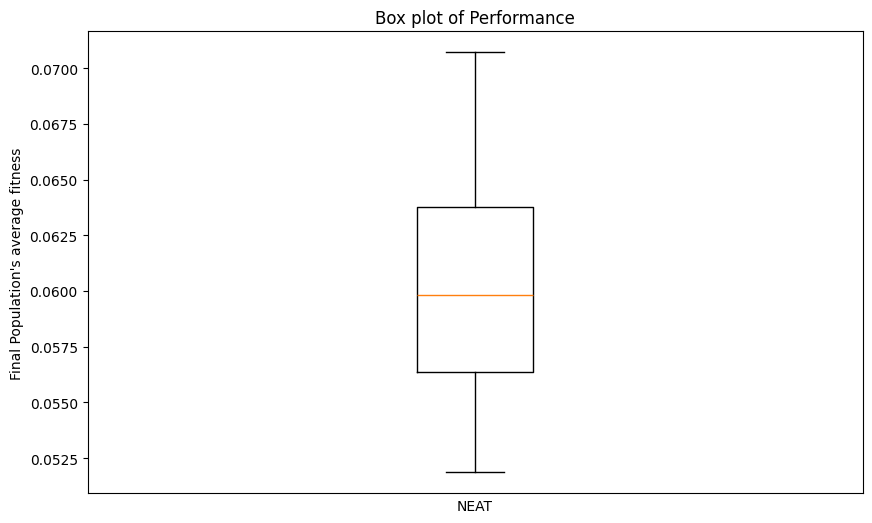

In [97]:
# Create the boxplot
plt.figure(figsize=(10, 6))
plt.boxplot(results_neat)
plt.title('Box plot of Performance')
plt.ylabel("Final Population's average fitness")
plt.xlabel("NEAT")
plt.xticks([])
plt.grid(False)
plt.show()

<a id='Eval-Metrics'></a>
# 7. Evaluation Metrics

In order to assess which of our algorithms fared better, we will perform a series of statistical tests on our result metric (RMSE), comparing all models.

Since we have so many models and different results, we will use the **Wilcoxon Signed-Rank test** to compare, in 1vs1 fashion, models where the only change is the max_init_depth (1vs1) or the initialization method. We will pick the best from there, and then apply the **Friedman test** to the "winners".

In [98]:
# All models results
all_results = {
    'GP Single Tournament, Grow, max_init_depth = 3': results_gp_single_tournament_grow_max_init_3,
    'GP Single Tournament, Grow, max_init_depth = 5': results_gp_single_tournament_grow_max_init_5,
    'GP Single Tournament, RHH': results_gp_single_tournament_rhh,
    'GP Single Tournament, Full': results_gp_single_tournament_full,
    'GP Double Tournament, Grow': results_gp_double_tournament_grow,
    'GP Double Tournament, RHH': results_gp_double_tournament_rhh,
    'GP Double Tournament, Full': results_gp_double_tournament_full,
    'GSGP Single Tournament, Grow' : results_gsgsp_grow,
    'GSGSP Single Tournament, Grow, optimized' : results_gsgsp_grow_optimized,
    'GSGSP Single Tournament, RHH' : results_gsgsp_rhh,
    'GSGP Single Tournament, Full' : results_gsgsp_full,
    'GSGP Double Tournament, Grow' : results_gsgsp_double_grow,
    'GSGP Double Tournament, RHH' : results_gsgsp_double_rhh,
    'GSGP Double Tournament, Full' : results_gsgsp_double_full,
    'NN' : results_nn,
    'NEAT' : results_neat
}

In [99]:
df_results = pd.DataFrame(all_results)

In [100]:
df_results.to_csv('all_results.csv', index=False)

In [101]:
df_results

,"GP Single Tournament, Grow, max_init_depth = 3","GP Single Tournament, Grow, max_init_depth = 5","GP Single Tournament, RHH","GP Single Tournament, Full","GP Double Tournament, Grow","GP Double Tournament, RHH","GP Double Tournament, Full","GSGP Single Tournament, Grow","GSGSP Single Tournament, Grow, optimized","GSGSP Single Tournament, RHH","GSGP Single Tournament, Full","GSGP Double Tournament, Grow","GSGP Double Tournament, RHH","GSGP Double Tournament, Full",NN,NEAT
0,0.000084,0.004858,0.007344,0.013595,0.084395,0.012567,0.004858,0.161427,0.069191,0.187567,0.202134,0.166583,0.230073,0.132728,0.208712,0.067989
1,0.005892,0.086029,0.116750,0.028424,0.099391,0.000650,0.004858,0.139362,0.068210,0.196702,0.108345,0.169957,0.242779,0.221876,0.064347,0.055327
2,0.000407,0.003804,0.004858,0.000129,0.084395,0.045638,0.004858,0.174708,0.063194,0.191855,0.109460,0.165283,0.248422,0.173288,0.065717,0.057578
3,0.000407,0.007776,0.052494,0.007826,0.084657,0.146809,0.007826,0.235709,0.062956,0.193448,0.114058,0.151977,0.204432,0.131387,0.062982,0.069643
4,0.000084,0.004858,0.004858,0.004858,0.086669,0.027203,0.004858,0.177356,0.061947,0.187066,0.111210,0.170515,0.243221,0.226005,0.349613,0.060568
5,0.000407,0.008059,0.023516,0.011368,0.099994,0.004858,0.022325,0.210174,0.132536,0.189062,0.232377,0.140075,0.154723,0.259099,0.384427,0.065918
6,0.000407,3.202504,0.004956,0.004858,0.084395,0.000882,0.008261,0.142665,0.066644,0.188003,0.068474,0.163409,0.252278,0.191075,0.108054,0.058179
7,0.009822,0.019143,0.007344,0.007344,0.086669,2.579684,0.009682,0.199333,0.146916,0.185286,0.222908,0.136991,0.178824,0.217735,0.081278,0.060116
8,0.000407,0.007344,0.010596,0.000674,0.084395,0.004858,0.004858,0.138970,0.062787,0.191007,0.090816,0.165200,0.249261,0.238347,0.087733,0.070706
9,0.000995,1.562469,0.006391,0.010596,0.085986,0.045338,0.024726,0.215751,0.160004,0.189844,0.237661,0.135898,0.172261,0.211389,0.064037,0.061562


**Friedman Test to understand if there are statistically significant differences among the algorithm results**

In [102]:
friedmanchisquare(results_gp_single_tournament_grow_max_init_3, \
   results_gp_single_tournament_grow_max_init_5, results_gp_single_tournament_full,\
       results_gsgsp_grow, results_gsgsp_grow_optimized, results_gsgsp_rhh, results_gsgsp_full,\
       results_gsgsp_double_grow, results_gsgsp_double_rhh, results_gsgsp_double_full,\
        results_nn, results_neat)

FriedmanchisquareResult(statistic=245.8428171641792, pvalue=2.0722302215270414e-46)

Friedman Test shows, without a shadow of doubt (p-value<0.05, in fact very very small), that there are significant differences between algorithms.

**Wilcoxon Signed-Rank Test Comparisons**

**GP Single Tournament, Grow, max_init_depth=3** vs **GP Single Tournament, Grow, max_init_depth=5**

In [103]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gp_single_tournament_grow_max_init_5)

WilcoxonResult(statistic=3.0, pvalue=9.313225746154785e-09)

This shows there are significant differences between the these algorithms. As we analyzed in our results above, we choose the one with `max_init_depth = 3`.

**GP Single Tournament, Grow** vs **GP Single Tournament, RHH**

In [104]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gp_single_tournament_rhh)

WilcoxonResult(statistic=2.0, pvalue=5.587935447692871e-09)

Again, p-value <0.05 indicates statistically significant differences in outcomes. Looking at the mean across al runs, we stick with the `Grow` initializer.

**GP Single Tournament, Grow** vs **GP Single Tournament, Full**

In [105]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gp_single_tournament_full)

WilcoxonResult(statistic=25.0, pvalue=1.6838312149047852e-06)

Again, p-value <0.05 indicates statistically significant differences in outcomes. Looking at the mean across al runs, we stick with the `Grow` initializer.

**GSGP, Grow** vs **GSGP, Grow, Optimized**

In [106]:
wilcoxon(results_gsgsp_grow, results_gsgsp_grow_optimized)

WilcoxonResult(statistic=19.0, pvalue=5.718320608139038e-07)

Statistically significant differences. We stick with the **optimized** version.

**GP Single Tournament, Grow** vs **GSGP, Grow, Optimized**

In [107]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gsgsp_grow_optimized)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [108]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gsgsp_grow_optimized)

(0.0014512674, 0.10123125)

Our GP Single Tournament Grow model is still to be beaten at this point.

**GP Single Tournament, Grow** vs **GSGP, RHH**

In [109]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gsgsp_rhh)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [110]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gsgsp_rhh)

(0.0014512674, 0.18038672)

**GP Single Tournament, Grow** vs **GSGP, Full**

In [111]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gsgsp_full)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [112]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gsgsp_full)

(0.0014512674, 0.14859731)

**GP Single Tournament, Grow** vs **GP, Double Tournament, Grow**

In [113]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gp_double_tournament_grow)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [114]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gp_double_tournament_grow)

(0.0014512674, 0.16687857)

**GP Single Tournament, Grow** vs **GP, Double Tournament, RHH**

In [115]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gp_double_tournament_rhh)

WilcoxonResult(statistic=16.0, pvalue=3.1478703022003174e-07)

In [116]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gp_double_tournament_rhh)

(0.0014512674, 0.21743117)

**GP Single Tournament, Grow** vs **GP, Double Tournament, Full**

In [117]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gp_double_tournament_full)

WilcoxonResult(statistic=12.0, pvalue=1.30385160446167e-07)

In [118]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gp_double_tournament_full)

(0.0014512674, 0.035840522)

**GP Single Tournament, Grow** vs **GSGP, Double Tournament, Grow**

In [119]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gsgsp_double_grow)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [120]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gsgsp_double_grow)

(0.0014512674, 0.15245542)

**GP Single Tournament, Grow** vs **GSGP, Double Tournament, RHH**

In [121]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gsgsp_double_rhh)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [122]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gsgsp_double_rhh)

(0.0014512674, 0.24322207)

**GP Single Tournament, Grow** vs **GSGP, Double Tournament, Full**

In [123]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_gsgsp_double_full)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [124]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_gsgsp_double_full)

(0.0014512674, 0.20276245)

**GP Single Tournament, Grow** vs **Neural Network**

In [125]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_nn)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [126]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_nn)

(0.0014512674, 0.42892413193980855)

**GP Single Tournament, Grow** vs **NEAT**

In [127]:
wilcoxon(results_gp_single_tournament_grow_max_init_3, results_neat)

WilcoxonResult(statistic=0.0, pvalue=1.862645149230957e-09)

In [128]:
np.mean(results_gp_single_tournament_grow_max_init_3), np.mean(results_neat)

(0.0014512674, 0.06016895398399467)

#### In light of these results, we conclude that the best performing algorithm is **Genetic Programming, Single Tournament Selection, Grow Initialization, with max_init_depth = 3**.

<a id='best-model'></a>
# 7. Best Model Plots

#### GP with single tournament selection, max_init_depth = 3

In [129]:
# Convert the datasets to numpy arrays
X = train.values
y = y_lactose.values

# Genetic programming parameters
fset = [function_map['add'], function_map['sub'], function_map['mul'], function_map['div']]

sspace_sml = {
    'n_dims': train.shape[1],
    'function_set': fset, 'constant_set': ERC(-1., 1.),
    'p_constants': 0.1,
    'max_init_depth': 3,
    'max_depth': 10,
    'n_batches': 1, 
    'device': 'cpu' 
}

gp_params = {
    'sspace': sspace_sml,
    'selection_pressure': 0.07,
    'mutation_prob': 0.1,
    'xo_prob': 0.9,
    'has_elitism': True,
    'allow_reproduction': False,
    'pop_size': 141,
    'device': 'cpu',
    'seed': 42
}


def create_dataloaders(X_train, y_train, X_val, y_val, batch_size, shuffle=True):
    ds_train = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    ds_val = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32))
    dl_train = DataLoader(ds_train, batch_size=batch_size, shuffle=shuffle)
    dl_val = DataLoader(ds_val, batch_size=batch_size, shuffle=shuffle)
    return dl_train, dl_val

def cross_val_genetic_programming(X, y, cv=10, shuffle=True, random_state=42, **gp_kwargs):
    kf = KFold(n_splits=cv, shuffle = True, random_state=random_state)
    scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)

        # Ensure batch_size does not exceed the number of samples
        current_batch_size = 141

        dl_train, dl_val = create_dataloaders(X_train, y_train, X_val, y_val, current_batch_size, shuffle)

        # Initialize genetic programming with the current fold's data
        pi_sml = SML(
            sspace=gp_kwargs['sspace'],
            ffunction=Ffunctions('rmse'),
            dl_train=dl_train, dl_test=dl_val,  
            n_jobs=8
        )

        mheuristic = GeneticAlgorithm(
            pi=pi_sml,
            initializer=grow,
            selector=prm_tournament(pressure=gp_kwargs['selection_pressure']),
            crossover=swap_xo,
            mutator=prm_subtree_mtn(initializer=prm_grow(gp_params['sspace'])),
            pop_size=gp_kwargs['pop_size'],
            p_m=gp_kwargs['mutation_prob'],
            p_c=gp_kwargs['xo_prob'],
            elitism=gp_kwargs['has_elitism'],
            reproduction=gp_kwargs['allow_reproduction'],
            device=gp_kwargs['device'],
            seed=gp_kwargs['seed']
        )

        # Solve the genetic programming algorithm for the current fold
        mheuristic.solve()
        fold_score = mheuristic.best_sol.fit
        scores.append(fold_score)

    return np.array(scores)

In [130]:
# Retrieve the results on the validation after executing the best model with 10 folds
best_model_10_folds = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=10,
    shuffle=True,
    **gp_params,
    random_state=15
)

In [131]:
# Retrieve the results on the validation after executing the best model with 15 folds
best_model_15_folds = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=15,
    shuffle=True,
    **gp_params,
    random_state=15
)

In [132]:
# Retrieve the results on the validation after executing the best model with 20 folds
best_model_20_folds = cross_val_genetic_programming(
    X=X,
    y=y,
    cv=20,
    shuffle=True,
    **gp_params,
    random_state=15
)

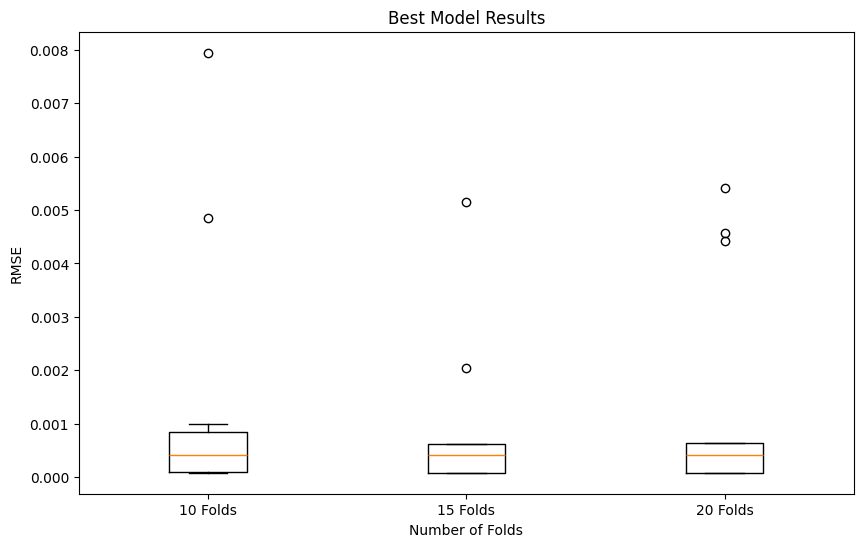

In [133]:
# Combine execution results into a single list for plotting
results = [best_model_10_folds, best_model_15_folds, best_model_20_folds]

# Create a boxplot comparing the executions with different amount of folds
plt.figure(figsize=(10, 6))
plt.boxplot(results, labels=['10 Folds', '15 Folds', '20 Folds'])
plt.title('Best Model Results')
plt.xlabel('Number of Folds')
plt.ylabel('RMSE')
plt.grid(False)
plt.show()

In [134]:
end_time = time.time()
total_time = end_time - start_time

print(f'Total time the notebook took to run: {round((total_time/60),2)} minutes.')

Total time the notebook took to run: 69.43 minutes.
